# Sentiment Analysis & Deep Learning for Short-Term Bitcoin Price Prediction

# Liew Jer Harng TP060601


In [4]:
!pip install requests
!pip install beautifulsoup4
!pip install pandas
!pip install openpyxl
!pip install nltk

# Webscraping Bitcoin News from Cryptotimes


In [8]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
import csv
from datetime import datetime, timedelta

# Function to initialize the CSV file
def initialize_csv():
    # Create an empty DataFrame with 'Headline' and 'Date' columns
    df = pd.DataFrame(columns=['Headline', 'Date'])
    # Save DataFrame to CSV file
    df.to_csv('bitcoin_news.csv', index=False)

# Function to crawl through crypto news pages and write to CSV
def crawl_crypto():    
    base_url = 'https://www.cryptotimes.io/category/bitcoin-news/'
    page_num = 1
    while True:
        url = base_url + f'page/{page_num}/'
        response = requests.get(url)
        if response.status_code != 200:
            break
        articles = parse_page(response)
        if not articles:
            break
        for article_info in articles:
            write_to_csv(article_info)
        page_num += 1

# Function to parse the page and extract article headlines and dates
def parse_page(response):
    soup = BeautifulSoup(response.text, 'html.parser')
    articles = soup.find_all('div', class_='p-wrap p-list p-list-2')
    data = []
    for article in articles:
        headline = article.find('h3', class_='entry-title').text.strip()
        date_element = article.find('time', class_='date published')
        date_text = date_element.get('datetime') if date_element else None
        
        # Parse the date correctly
        date = parse_date(date_text)
        data.append({'Headline': headline, 'Date': date})
    return data

def parse_date(date_text):
    if not date_text:
        return None
    try:
        if 'hours ago' in date_text or 'hour ago' in date_text or 'mins ago' in date_text:
            hours = int(date_text.split(' ')[0])
            date = datetime.now() - timedelta(hours=hours)
            return date.strftime('%Y-%m-%d %H:%M:%S')
        else:
            date = datetime.fromisoformat(date_text)
            return date.strftime('%Y-%m-%d %H:%M:%S')
    except Exception as e:
        print(f"Error parsing date: {e}")
        return None

# Function to write article information to CSV
def write_to_csv(article_info):
    # Append new data to the CSV file
    with open('bitcoin_news.csv', mode='a', newline='', encoding='utf-8') as file:
        writer = csv.DictWriter(file, fieldnames=['Headline', 'Date'])
        writer.writerow(article_info)

# Function to execute the full scraping process
def execute_scraping():
    initialize_csv()
    crawl_crypto()

# Call the function to start the scraping process
execute_scraping()

Error parsing date: Invalid isoformat string: '1 hour ago'
Error parsing date: Invalid isoformat string: '1 hour ago'
Error parsing date: Invalid isoformat string: '1 hour ago'
Error parsing date: Invalid isoformat string: '1 hour ago'
Error parsing date: Invalid isoformat string: '1 hour ago'
Error parsing date: Invalid isoformat string: '1 hour ago'
Error parsing date: Invalid isoformat string: '1 hour ago'
Error parsing date: Invalid isoformat string: '1 hour ago'
Error parsing date: Invalid isoformat string: '1 hour ago'
Error parsing date: Invalid isoformat string: '1 hour ago'
Error parsing date: Invalid isoformat string: '1 hour ago'
Error parsing date: Invalid isoformat string: '1 hour ago'
Error parsing date: Invalid isoformat string: '1 hour ago'
Error parsing date: Invalid isoformat string: '1 hour ago'
Error parsing date: Invalid isoformat string: '1 hour ago'
Error parsing date: Invalid isoformat string: '1 hour ago'
Error parsing date: Invalid isoformat string: '1 hour ag


KeyboardInterrupt



In [ ]:
# Load the data and display it
df = pd.read_csv('bitcoin_news.csv')
display(df)

# Retrieve historical price data from Binance API


In [ ]:
import requests
import pandas as pd
from datetime import datetime, timedelta

def get_unix_timestamp(date):
    return int(date.timestamp()) * 1000

def get_binance_data(symbol, interval, start_time, end_time, limit):
    base_url = "https://api.binance.com/api/v3/klines"
    params = {
        "symbol": symbol,
        "interval": interval,
        "startTime": start_time,
        "endTime": end_time,
        "limit": limit
    }
    response = requests.get(base_url, params=params)
    if response.status_code == 200:
        data = response.json()
        columns = ['Date', 'Open', 'High', 'Low', 'Close']
        df = pd.DataFrame([row[:5] for row in data], columns=columns)
        df['Date'] = pd.to_datetime(df['Date'], unit='ms')
        return df  # Selecting only the necessary columns
    else:
        print("Failed to fetch data from Binance API")
        return None

def execute_binance_scraping():
    # Define the time range
    start_date = datetime(2021, 3, 12)
    end_date = datetime.now()

    # Initialize an empty DataFrame to store the fetched data
    bitcoin_data_combined = pd.DataFrame()

    # Set the maximum limit for data points
    max_limit = 1000

    # Fetch data iteratively for each month
    current_date = start_date
    while current_date < end_date:
        end_interval = min(current_date + timedelta(days=30), end_date)
        start_timestamp = get_unix_timestamp(current_date)
        end_timestamp = get_unix_timestamp(end_interval)
        data = get_binance_data('BTCUSDT', '1d', start_timestamp, end_timestamp, max_limit)
        if data is not None:
            bitcoin_data_combined = pd.concat([bitcoin_data_combined, data], ignore_index=True)
        current_date = end_interval

    # Export the dataset to a CSV file
    bitcoin_data_combined.to_csv('bitcoin_price_data.csv', index=False)

# Call the function to start the scraping process
execute_binance_scraping()

In [35]:
import yfinance as yf
import pandas as pd
from datetime import datetime

def get_yahoo_finance_data(symbol, start_date, end_date=None):
    # If no end_date is provided, set it to the current date
    if end_date is None:
        end_date = datetime.now().strftime('%Y-%m-%d')
    
    # Fetch historical market data from Yahoo Finance
    data = yf.download(symbol, start=start_date, end=end_date)
    
    # Selecting only the required columns: 'Open', 'High', 'Low', 'Close'
    data = data[['Open', 'High', 'Low', 'Close']]
    
    # Reset the index to have 'Date' as a column
    data.reset_index(inplace=True)
    
    return data

def execute_yahoo_finance_scraping(start_date, end_date=None):
    # Get historical data for Bitcoin (BTC-USD) from Yahoo Finance
    bitcoin_data = get_yahoo_finance_data('BTC-USD', start_date, end_date)

    # Export to CSV
    if not bitcoin_data.empty:
        bitcoin_data.to_csv('bitcoin_price_data.csv', index=False)
        print("Data exported successfully.")
    else:
        print("No data available.")

# Example Usage:
# To fetch from a specific start date to now:
execute_yahoo_finance_scraping('2021-03-12')

# To fetch from a specific start date to a specific end date:
#execute_yahoo_finance_scraping('2021-03-12', '2023-03-12')




[*********************100%%**********************]  1 of 1 completed
Data exported successfully.


C:\Users\davej\anaconda3\Lib\site-packages\yfinance\utils.py:782: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


In [36]:
df = pd.read_csv('bitcoin_price_data.csv')
display(df)

,Date,Open,High,Low,Close
0,2021-03-12,57821.218750,57996.621094,55376.648438,57332.089844
1,2021-03-13,57343.371094,61683.863281,56217.972656,61243.085938
2,2021-03-14,61221.132812,61597.917969,59302.316406,59302.316406
3,2021-03-15,59267.429688,60540.992188,55393.164062,55907.199219
4,2021-03-16,55840.785156,56833.179688,53555.027344,56804.902344
...,...,...,...,...,...
1310,2024-10-12,62444.617188,63448.785156,62443.269531,63193.023438
1311,2024-10-13,63192.945312,63272.652344,62035.636719,62851.375000
1312,2024-10-14,62848.398438,66482.492188,62442.152344,66046.125000
1313,2024-10-15,66050.367188,67881.679688,64809.195312,67041.109375


In [10]:
# Read the CSV file and display the data
df = pd.read_csv('bitcoin_price_data.csv')
display(df)

,Date,Open,High,Low,Close
0,2021-03-12,57773.15,58081.51,54962.84,57221.72
1,2021-03-13,57221.72,61844.00,56078.23,61188.39
2,2021-03-14,61188.38,61724.79,58966.78,58968.31
3,2021-03-15,58976.08,60633.43,54600.00,55605.20
4,2021-03-16,55605.20,56938.29,53271.34,56900.75
...,...,...,...,...,...
1288,2024-09-20,62948.00,64133.32,62350.00,63201.05
1289,2024-09-21,63201.05,63559.90,62758.00,63348.96
1290,2024-09-22,63348.97,64000.00,62357.93,63578.76
1291,2024-09-23,63578.76,64745.88,62538.75,63339.99


# EDA

## EDA on Sentiment

In [5]:
import matplotlib.pyplot as plt
import pandas as pd

In [6]:
# First, inspect the data to understand its structure and contents.

df = pd.read_csv('bitcoin_news.csv')
print(df.head())  # Display the first few rows of the DataFrame
print(df.info())  # Get a concise summary of the DataFrame

                                            Headline                 Date
0  Ro Khanna Becomes First Democrat to Support Bi...  2024-10-03 14:44:17
1  Bitcoin ETFs’ Total Inflows Surpass the $50 Bi...  2024-10-02 17:50:10
2  Iran Vs. Israel: Why Bitcoin fell and Gold Reb...  2024-10-02 17:07:44
3  Prepare For Volatility As $7.7B of Bitcoin And...  2024-09-27 18:17:26
4  Crypto Investor Shares Rare Glimpse of Bitcoin...  2024-09-27 12:31:26
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1379 entries, 0 to 1378
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Headline  1379 non-null   object
 1   Date      1379 non-null   object
dtypes: object(2)
memory usage: 21.7+ KB
None


In [7]:
# Check for any missing values and handle them if necessary. 
# This step is crucial as it affects the quality of the EDA.

print(df.isnull().sum())  # Check for missing values

Headline    0
Date        0
dtype: int64


In [8]:
# Convert the 'Date' column to datetime format to facilitate time-series analysis.

df['Date'] = pd.to_datetime(df['Date'])
df

,Headline,Date
0,Ro Khanna Becomes First Democrat to Support Bi...,2024-10-03 14:44:17
1,Bitcoin ETFs’ Total Inflows Surpass the $50 Bi...,2024-10-02 17:50:10
2,Iran Vs. Israel: Why Bitcoin fell and Gold Reb...,2024-10-02 17:07:44
3,Prepare For Volatility As $7.7B of Bitcoin And...,2024-09-27 18:17:26
4,Crypto Investor Shares Rare Glimpse of Bitcoin...,2024-09-27 12:31:26
...,...,...
1374,Goldman Sachs to Become Second Big Bank Offeri...,2021-04-02 06:36:24
1375,"Chipotle Offers Free Burritos and $100,000 in...",2021-04-01 13:28:54
1376,Now You Can Pay in Bitcoin To Buy Tesla!,2021-03-24 10:31:23
1377,Norwegian Giant Aker ASA Invest in Bitcoin Via...,2021-03-17 12:28:28


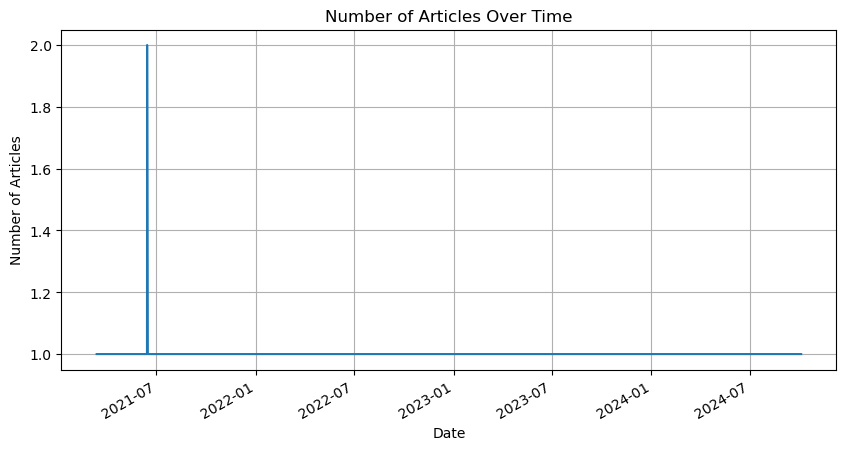

In [9]:
# Plot the number of articles over time
# This will help in understanding the frequency and distribution of articles over time.

df['Date'].value_counts().sort_index().plot(kind='line', figsize=(10, 5))
plt.title('Number of Articles Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Articles')
plt.grid(True)
plt.show()


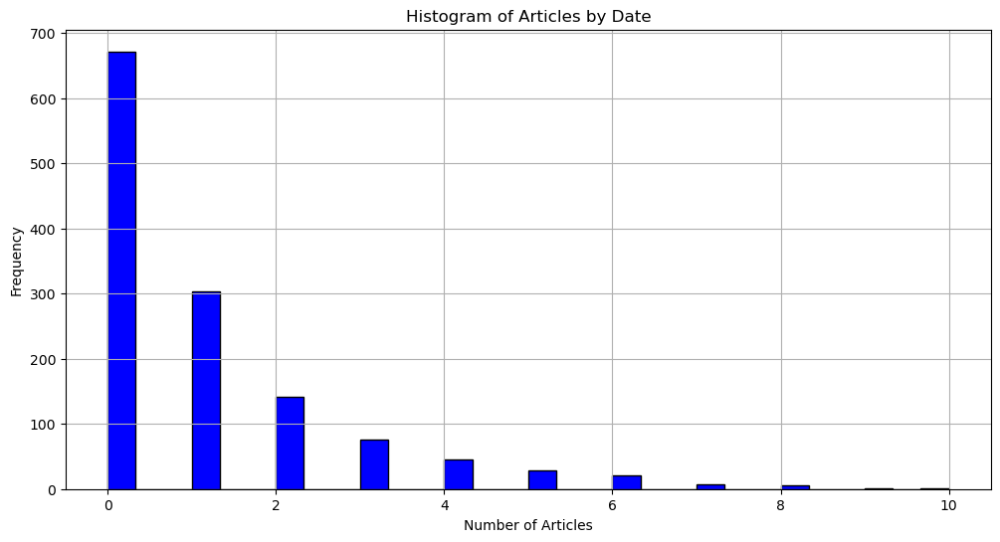

In [10]:
# Load the dataset
df = pd.read_csv('bitcoin_news.csv')

# Convert the 'Date' column to datetime format
df['Date'] = pd.to_datetime(df['Date'])

# Time-based Analysis
# Resampling data by day and counting entries
time_analysis = df.resample('D', on='Date').count()

# Histogram of articles by date
plt.figure(figsize=(12, 6))
plt.hist(time_analysis['Headline'], bins=30, color='blue', edgecolor='black')
plt.title('Histogram of Articles by Date')
plt.xlabel('Number of Articles')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


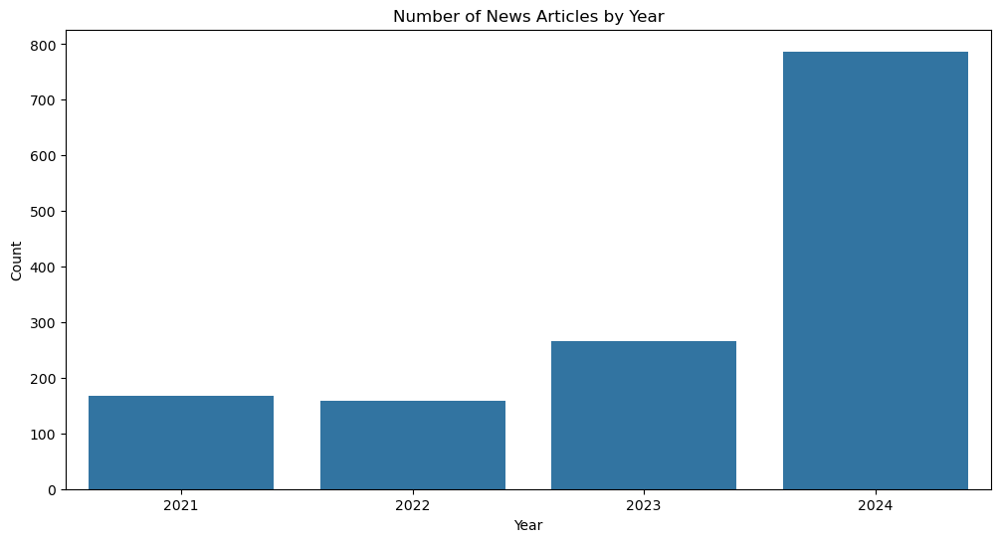

In [11]:
# Analyze the distribution of news over time
# This type of analysis can provide valuable insights into the trends and patterns in the dataset, 
# which can be useful for further analysis or decision-making.
import seaborn as sns

df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day

plt.figure(figsize=(12, 6))
sns.countplot(x='Year', data=df)
plt.title('Number of News Articles by Year')
plt.xlabel('Year')
plt.ylabel('Count')
plt.show()

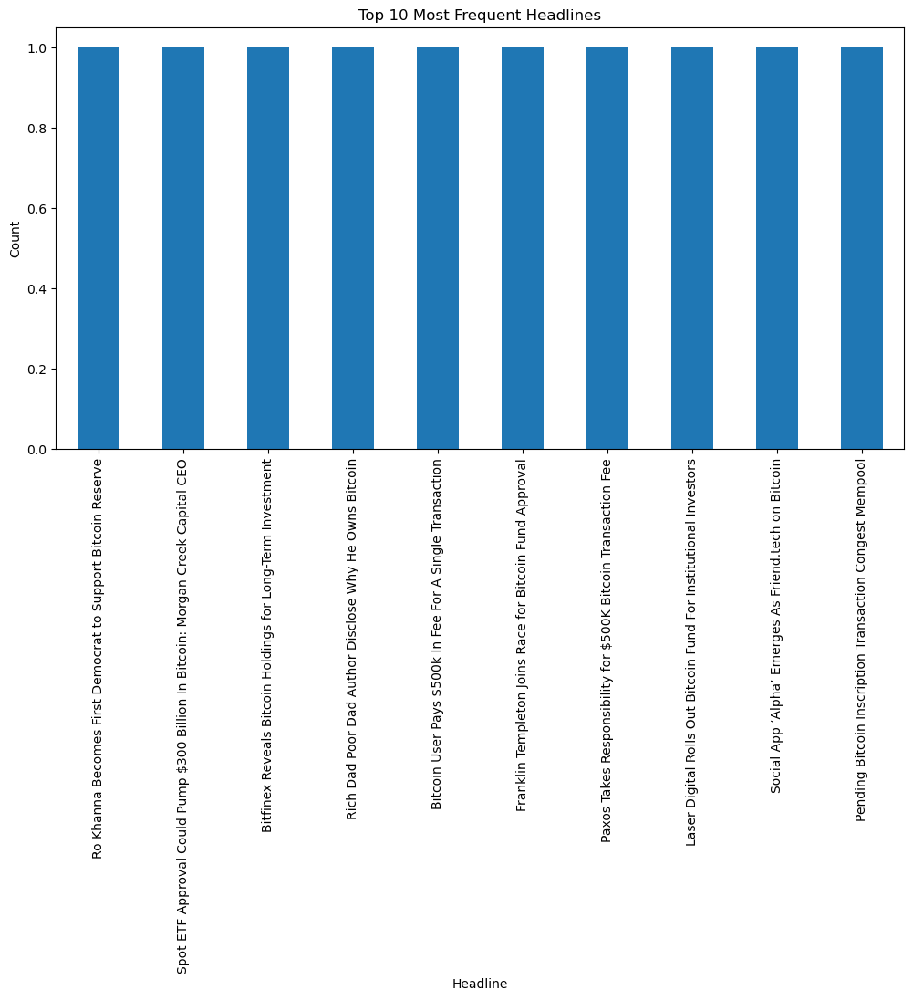

In [12]:
#5. Analyze the most frequent headlines
top_headlines = df['Headline'].value_counts().head(10)
plt.figure(figsize=(12, 6))
top_headlines.plot(kind='bar')
plt.title('Top 10 Most Frequent Headlines')
plt.xlabel('Headline')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

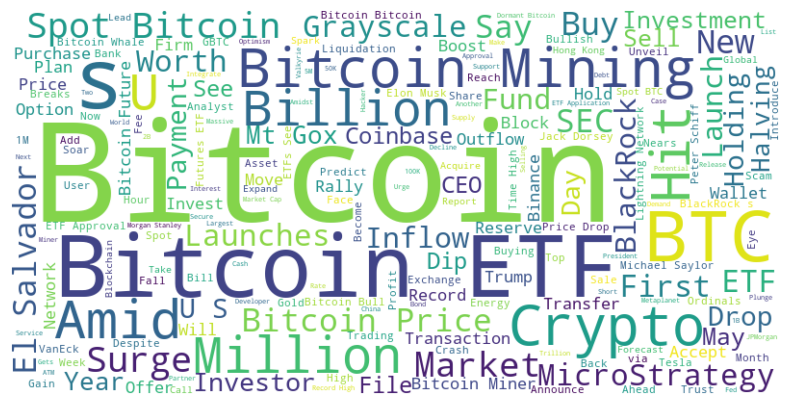

In [13]:
from wordcloud import WordCloud

# Generate a word cloud image
wordcloud = WordCloud(background_color='white', width=800, height=400).generate(' '.join(df['Headline']))

# Display the generated image:
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()


## EDA on historical price data


In [14]:
import pandas as pd

df = pd.read_csv('bitcoin_price_data.csv')
print(df.head())
print(df.info())
print(df.describe())


         Date      Open      High       Low     Close
0  2021-03-12  57773.15  58081.51  54962.84  57221.72
1  2021-03-13  57221.72  61844.00  56078.23  61188.39
2  2021-03-14  61188.38  61724.79  58966.78  58968.31
3  2021-03-15  58976.08  60633.43  54600.00  55605.20
4  2021-03-16  55605.20  56938.29  53271.34  56900.75
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1303 entries, 0 to 1302
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    1303 non-null   object 
 1   Open    1303 non-null   float64
 2   High    1303 non-null   float64
 3   Low     1303 non-null   float64
 4   Close   1303 non-null   float64
dtypes: float64(4), object(1)
memory usage: 51.0+ KB
None
               Open          High           Low         Close
count   1303.000000   1303.000000   1303.000000   1303.000000
mean   39821.542924  40715.037874  38843.961550  39824.035480
std    15900.032162  16259.548321  15485.803527  15903.071397
min  

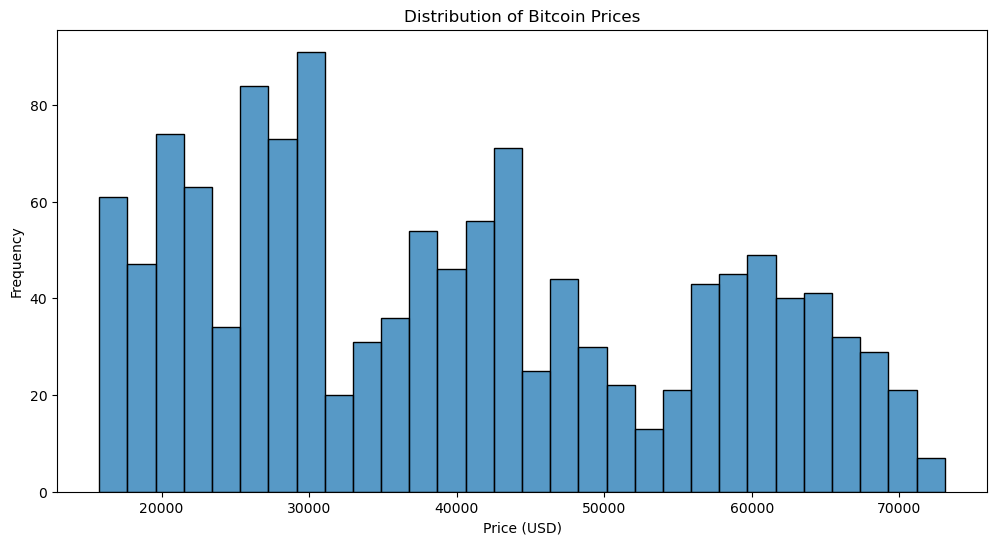

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
sns.histplot(data=df, x='Close', bins=30)
plt.title('Distribution of Bitcoin Prices')
plt.xlabel('Price (USD)')
plt.ylabel('Frequency')
plt.show()

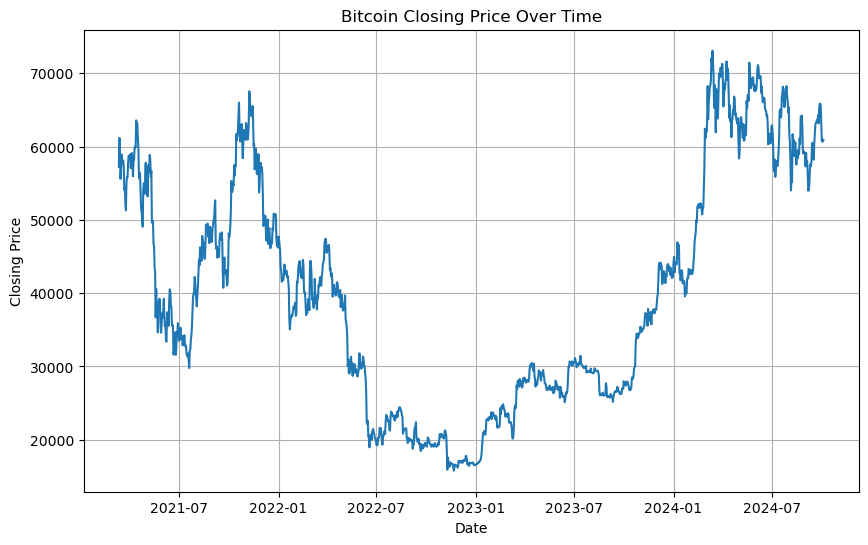

In [16]:
# closing prices of Bitcoin over the time period from January 2018 to May 2024. 
# We can see the overall upward trend in Bitcoin prices, with some significant fluctuations and volatility.
# Load the data
df = pd.read_csv('bitcoin_price_data.csv')

# Convert 'Date' column to datetime type
df['Date'] = pd.to_datetime(df['Date'])

# Set the 'Date' column as the index of the dataframe
df.set_index('Date', inplace=True)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(df.index, df['Close'])  # Using 'o' as marker for better visibility

plt.title('Bitcoin Closing Price Over Time')
plt.xlabel('Date')
plt.ylabel('Closing Price')
plt.grid(True)
plt.show()


In [17]:
# Load the data
df = pd.read_csv('bitcoin_price_data.csv')
print(f"Minimum price: ${df['Close'].min():.2f}")
print(f"Maximum price: ${df['Close'].max():.2f}")
print(f"Average price: ${df['Close'].mean():.2f}")
print(f"Standard deviation: ${df['Close'].std():.2f}")


Minimum price: $15781.29
Maximum price: $73072.41
Average price: $39824.04
Standard deviation: $15903.07


In [18]:
# daily price changes to understand the volatility of the Bitcoin market.
# This indicates that the Bitcoin market has experienced significant daily price fluctuations, 
# with an average daily change of 0.14% and a standard deviation of 3.67%.
df['Daily_Change'] = df['Close'].pct_change()
print(f"Average daily change: {df['Daily_Change'].mean():.2%}")
print(f"Standard deviation of daily changes: {df['Daily_Change'].std():.2%}")


Average daily change: 0.05%
Standard deviation of daily changes: 3.15%


In [19]:
correlation = df[['Open', 'High', 'Low', 'Close']].corr()
print(correlation)

           Open      High       Low     Close
Open   1.000000  0.998429  0.997264  0.996387
High   0.998429  1.000000  0.996835  0.998405
Low    0.997264  0.996835  1.000000  0.998123
Close  0.996387  0.998405  0.998123  1.000000


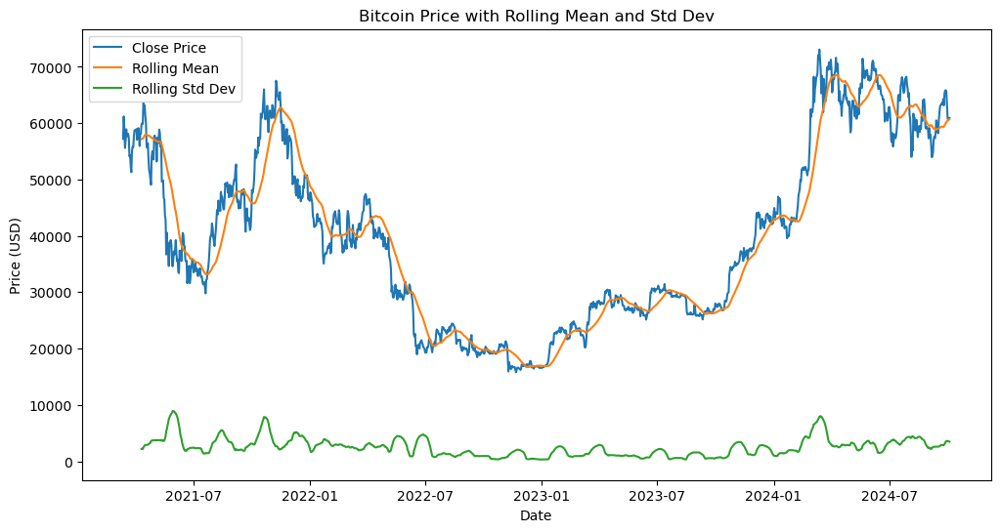

In [20]:
# Load the data
df = pd.read_csv('bitcoin_price_data.csv')

# Convert the Date column to datetime
df['Date'] = pd.to_datetime(df['Date'])

# Set the Date column as the index
df.set_index('Date', inplace=True)

# Calculate the rolling mean and standard deviation
rolling_mean = df['Close'].rolling(window=30).mean()
rolling_std = df['Close'].rolling(window=30).std()

# Create a line plot with rolling mean and standard deviation
plt.figure(figsize=(12, 6))
plt.plot(df['Close'], label='Close Price')
plt.plot(rolling_mean, label='Rolling Mean')
plt.plot(rolling_std, label='Rolling Std Dev')
plt.xlabel('Date')
plt.ylabel('Price (USD)')
plt.title('Bitcoin Price with Rolling Mean and Std Dev')
plt.legend()
plt.show()

In [21]:
import pandas as pd
import plotly.graph_objects as go

# Read the CSV file
df = pd.read_csv('bitcoin_price_data.csv')

# Ensure the 'Date' column is in datetime format
df['Date'] = pd.to_datetime(df['Date'])

# Create a candlestick chart using Plotly
fig = go.Figure(data=[go.Candlestick(x=df['Date'],
                open=df['Open'],
                high=df['High'],
                low=df['Low'],
                close=df['Close'])])

# Customize the chart layout
fig.update_layout(title='Bitcoin Price Candlestick Chart',
                  yaxis_title='Price (USD)',
                  xaxis_rangeslider_visible = False)

# Show the chart
fig.show()

# Preprocess


## Data Cleaning on News Dataset


Lowercasing: Convert all text to lowercase to ensure consistency.

Contractions: Expand common contractions (e.g., "don't" becomes "do not"). 

Removing Special Characters: Remove any special characters, such as punctuation marks, emojis, and other non-alphanumeric characters.

Removing Stopwords: Remove common stopwords, such as 'is', 'the', 'and', etc., as they often do not carry significant sentiment information.

Lemmatization: Reducing words to their base or root form

Dealing with Dates: Removing the time published

In [39]:
# Lowercasing: Convert all text to lowercase to ensure consistency.

import pandas as pd

# Function to lowercase the headlines
def lowercase_headlines(df):
    df['lowcase_headline'] = df['Headline'].str.lower()
    return df

# Read the CSV file into a DataFrame
df = pd.read_csv('bitcoin_news.csv')

# Display the original text
headline = df['Headline']
print("\nOriginal text:")
display(headline)

# Apply the lowercasing function
df = lowercase_headlines(df)

print("\nOriginal text and preprocessed text:\n")
for index, row in df.head(5).iterrows():
    original_headline = row['Headline']
    preprocessed_headline = row['lowcase_headline']
    print(f"Original: {original_headline}")
    print(f"Preprocessed: {preprocessed_headline}\n")

# Display the DataFrame to verify the changes
print("\nUpdated DataFrame with preprocessed text:")
display(df.head())



Original text:


0       BlackRock Buys $391.8M Bitcoin Boosts Holdings...
1       Italy to raise Capital Gains Tax on Bitcoin to...
2       Google Restores Bitcoin and Crypto Price Chart...
3       Bitcoin Will Thrive, No Matter Who Wins US Ele...
4       Man Sues Newport Council for £495 Million Over...
                              ...                        
1395    Goldman Sachs to Become Second Big Bank Offeri...
1396    Chipotle Offers  Free Burritos and $100,000 in...
1397             Now You Can Pay in Bitcoin To Buy Tesla!
1398    Norwegian Giant Aker ASA Invest in Bitcoin Via...
1399    Microstrategy To Buy Another Bitcoin Dip Despi...
Name: Headline, Length: 1400, dtype: object


Original text and preprocessed text:

Original: BlackRock Buys $391.8M Bitcoin Boosts Holdings to $25 Billion
Preprocessed: blackrock buys $391.8m bitcoin boosts holdings to $25 billion

Original: Italy to raise Capital Gains Tax on Bitcoin to 42% ahead of ‘Bitcoin Boom’
Preprocessed: italy to raise capital gains tax on bitcoin to 42% ahead of ‘bitcoin boom’

Original: Google Restores Bitcoin and Crypto Price Charts in Search Results
Preprocessed: google restores bitcoin and crypto price charts in search results

Original: Bitcoin Will Thrive, No Matter Who Wins US Elections: BlackRock CEO
Preprocessed: bitcoin will thrive, no matter who wins us elections: blackrock ceo

Original: Man Sues Newport Council for £495 Million Over Lost Bitcoin
Preprocessed: man sues newport council for £495 million over lost bitcoin


Updated DataFrame with preprocessed text:


,Headline,Date,lowcase_headline
0,BlackRock Buys $391.8M Bitcoin Boosts Holdings...,2024-10-17 14:15:34,blackrock buys $391.8m bitcoin boosts holdings...
1,Italy to raise Capital Gains Tax on Bitcoin to...,2024-10-16 16:47:12,italy to raise capital gains tax on bitcoin to...
2,Google Restores Bitcoin and Crypto Price Chart...,2024-10-16 11:50:30,google restores bitcoin and crypto price chart...
3,"Bitcoin Will Thrive, No Matter Who Wins US Ele...",2024-10-15 12:55:28,"bitcoin will thrive, no matter who wins us ele..."
4,Man Sues Newport Council for £495 Million Over...,2024-10-15 10:55:14,man sues newport council for £495 million over...


In [40]:
import pandas as pd
import contractions
import re

# Function to expand contractions in a text with special handling for 'u.s.'
def expand_contractions(text):
    # Special case for "u.s" and "u.s."
    text = re.sub(r'\bu\.s\.?(?=\s|$)', 'united states', text, flags=re.IGNORECASE)

    # Apply contractions expansion to the rest of the text
    expanded_text = contractions.fix(text)
    return expanded_text

# Function to apply contractions expansion to the DataFrame
def apply_expand_contractions(df):
    df['expanded_headline'] = df['lowcase_headline'].apply(expand_contractions)
    return df

# Assuming the DataFrame 'df' already exists with 'lowcase_headline' column
# Apply the contractions expansion function
df = apply_expand_contractions(df)

# Display original and preprocessed text for headlines containing contractions
count = 0
print("\nOriginal text and preprocessed text for the first 5 headlines with contractions:\n")
for index, row in df.iterrows():
    original_headline = row['lowcase_headline']
    preprocessed_headline = row['expanded_headline']
    if original_headline != preprocessed_headline:    
        print(f"Original: {original_headline}")
        print(f"Preprocessed: {preprocessed_headline}\n")
        count += 1
    if count == 5:  # Stop after printing 5 headlines with contractions
        break

# Display the DataFrame to verify the changes
print("\nUpdated DataFrame with preprocessed text:")
display(df.head())



Original text and preprocessed text for the first 5 headlines with contractions:

Original: u.s. government to auction $4.4b in bitcoin from silk road!
Preprocessed: united states government to auction $4.4b in bitcoin from silk road!

Original: hong kong bitcoin etfs reach $256m but lag behind the u.s
Preprocessed: hong kong bitcoin etfs reach $256m but lag behind the united states

Original: paypal’s peter thiel warns society isn’t ready for bitcoin’s potential
Preprocessed: paypal’s peter thiel warns society is not ready for bitcoin’s potential

Original: spot bitcoin etfs in u.s. draw major investor interest
Preprocessed: spot bitcoin etfs in united states draw major investor interest

Original: u.s. transfers 10,000 silk road bitcoin to coinbase prime
Preprocessed: united states transfers 10,000 silk road bitcoin to coinbase prime


Updated DataFrame with preprocessed text:


,Headline,Date,lowcase_headline,expanded_headline
0,BlackRock Buys $391.8M Bitcoin Boosts Holdings...,2024-10-17 14:15:34,blackrock buys $391.8m bitcoin boosts holdings...,blackrock buys $391.8m bitcoin boosts holdings...
1,Italy to raise Capital Gains Tax on Bitcoin to...,2024-10-16 16:47:12,italy to raise capital gains tax on bitcoin to...,italy to raise capital gains tax on bitcoin to...
2,Google Restores Bitcoin and Crypto Price Chart...,2024-10-16 11:50:30,google restores bitcoin and crypto price chart...,google restores bitcoin and crypto price chart...
3,"Bitcoin Will Thrive, No Matter Who Wins US Ele...",2024-10-15 12:55:28,"bitcoin will thrive, no matter who wins us ele...","bitcoin will thrive, no matter who wins us ele..."
4,Man Sues Newport Council for £495 Million Over...,2024-10-15 10:55:14,man sues newport council for £495 million over...,man sues newport council for £495 million over...


In [41]:
import re

# Function to remove special characters in a text
def remove_special_characters(text):
    # Remove punctuation marks
    text = re.sub(r'[^\w\s]', '', text)
    # Remove emojis
    text = text.encode('ascii', 'ignore').decode('ascii')
    # Remove other non-alphanumeric characters
    text = re.sub(r'[^a-zA-Z0-9\s]', '', text)
    return text

# Function to apply special character removal to the DataFrame
def apply_remove_special_characters(df):
    df['rm_character_headline'] = df['expanded_headline'].apply(remove_special_characters)
    return df

# Assuming the DataFrame 'df' already exists with 'expanded_headline' column
# Apply the special character removal function
df = apply_remove_special_characters(df)

# Display original and preprocessed text for headlines containing special characters
count = 0
print("\nOriginal text and preprocessed text for headlines with special characters:\n")
for index, row in df.iterrows():
    original_headline = row['expanded_headline']
    preprocessed_headline = row['rm_character_headline']
    if original_headline != preprocessed_headline:
        print(f"Original: {original_headline}")
        print(f"Preprocessed: {preprocessed_headline}\n")
        count += 1
    if count == 5:  # Stop after printing 5 headlines with special characters removed
        break

# Display the DataFrame to verify the changes
print("\nUpdated DataFrame with preprocessed text:")
display(df.head())



Original text and preprocessed text for headlines with special characters:

Original: blackrock buys $391.8m bitcoin boosts holdings to $25 billion
Preprocessed: blackrock buys 3918m bitcoin boosts holdings to 25 billion

Original: italy to raise capital gains tax on bitcoin to 42% ahead of ‘bitcoin boom’
Preprocessed: italy to raise capital gains tax on bitcoin to 42 ahead of bitcoin boom

Original: bitcoin will thrive, no matter who wins us elections: blackrock ceo
Preprocessed: bitcoin will thrive no matter who wins us elections blackrock ceo

Original: man sues newport council for £495 million over lost bitcoin
Preprocessed: man sues newport council for 495 million over lost bitcoin

Original: bitcoin price surges 6% to $66,400, highest since july 30
Preprocessed: bitcoin price surges 6 to 66400 highest since july 30


Updated DataFrame with preprocessed text:


,Headline,Date,lowcase_headline,expanded_headline,rm_character_headline
0,BlackRock Buys $391.8M Bitcoin Boosts Holdings...,2024-10-17 14:15:34,blackrock buys $391.8m bitcoin boosts holdings...,blackrock buys $391.8m bitcoin boosts holdings...,blackrock buys 3918m bitcoin boosts holdings t...
1,Italy to raise Capital Gains Tax on Bitcoin to...,2024-10-16 16:47:12,italy to raise capital gains tax on bitcoin to...,italy to raise capital gains tax on bitcoin to...,italy to raise capital gains tax on bitcoin to...
2,Google Restores Bitcoin and Crypto Price Chart...,2024-10-16 11:50:30,google restores bitcoin and crypto price chart...,google restores bitcoin and crypto price chart...,google restores bitcoin and crypto price chart...
3,"Bitcoin Will Thrive, No Matter Who Wins US Ele...",2024-10-15 12:55:28,"bitcoin will thrive, no matter who wins us ele...","bitcoin will thrive, no matter who wins us ele...",bitcoin will thrive no matter who wins us elec...
4,Man Sues Newport Council for £495 Million Over...,2024-10-15 10:55:14,man sues newport council for £495 million over...,man sues newport council for £495 million over...,man sues newport council for 495 million over ...


In [42]:
import re

# Function to remove multiple spaces in a text
def remove_mult_spaces(text):
    return re.sub(r"\s+", " ", text)

# Function to apply the removal of multiple spaces to the DataFrame
def apply_remove_mult_spaces(df):
    df['rm_spaces_headline'] = df['rm_character_headline'].apply(remove_mult_spaces)
    return df

# Assuming the DataFrame 'df' already exists with 'rm_character_headline' column
# Apply the multiple spaces removal function
df = apply_remove_mult_spaces(df)

# Display original and preprocessed text for headlines containing removed spaces
count = 0
print("\nOriginal text and preprocessed text for headlines with removed spaces:\n")
for index, row in df.iterrows():
    original_headline = row['rm_character_headline']
    preprocessed_headline = row['rm_spaces_headline']
    if original_headline != preprocessed_headline:
        print(f"Original: {original_headline}")
        print(f"Preprocessed: {preprocessed_headline}\n")
        count += 1
    if count == 5:  # Stop after printing 5 headlines with removed spaces
        break

# Display the DataFrame to verify the changes
print("\nUpdated DataFrame with preprocessed text:")
display(df.head())


Original text and preprocessed text for headlines with removed spaces:

Original: mt gox extends repayments deadline  to october 31 2025
Preprocessed: mt gox extends repayments deadline to october 31 2025

Original: could btc breakout  hit 70000 by september end bitcoin price prediction
Preprocessed: could btc breakout hit 70000 by september end bitcoin price prediction

Original: bitcoin adoption in el salvador is slower than expected  nayib bukele
Preprocessed: bitcoin adoption in el salvador is slower than expected nayib bukele

Original: united states govt may sell all its bitcoin holdings  peter schiff
Preprocessed: united states govt may sell all its bitcoin holdings peter schiff

Original: united states government holds 12b in bitcoin  arkham
Preprocessed: united states government holds 12b in bitcoin arkham


Updated DataFrame with preprocessed text:


,Headline,Date,lowcase_headline,expanded_headline,rm_character_headline,rm_spaces_headline
0,BlackRock Buys $391.8M Bitcoin Boosts Holdings...,2024-10-17 14:15:34,blackrock buys $391.8m bitcoin boosts holdings...,blackrock buys $391.8m bitcoin boosts holdings...,blackrock buys 3918m bitcoin boosts holdings t...,blackrock buys 3918m bitcoin boosts holdings t...
1,Italy to raise Capital Gains Tax on Bitcoin to...,2024-10-16 16:47:12,italy to raise capital gains tax on bitcoin to...,italy to raise capital gains tax on bitcoin to...,italy to raise capital gains tax on bitcoin to...,italy to raise capital gains tax on bitcoin to...
2,Google Restores Bitcoin and Crypto Price Chart...,2024-10-16 11:50:30,google restores bitcoin and crypto price chart...,google restores bitcoin and crypto price chart...,google restores bitcoin and crypto price chart...,google restores bitcoin and crypto price chart...
3,"Bitcoin Will Thrive, No Matter Who Wins US Ele...",2024-10-15 12:55:28,"bitcoin will thrive, no matter who wins us ele...","bitcoin will thrive, no matter who wins us ele...",bitcoin will thrive no matter who wins us elec...,bitcoin will thrive no matter who wins us elec...
4,Man Sues Newport Council for £495 Million Over...,2024-10-15 10:55:14,man sues newport council for £495 million over...,man sues newport council for £495 million over...,man sues newport council for 495 million over ...,man sues newport council for 495 million over ...


In [43]:
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize

# Download necessary resources from nltk if you haven't done so
nltk.download('punkt')
nltk.download('wordnet')

# Initialize lemmatizer
lemmatizer = WordNetLemmatizer()

# Function to perform lemmatization
def lemmatize_text(text):
    # Tokenize the text into words
    words = word_tokenize(text)
    # Lemmatize each word and join them back into a single string
    lemmatized_text = ' '.join([lemmatizer.lemmatize(word) for word in words])
    return lemmatized_text

# Function to apply lemmatization to the DataFrame
def apply_lemmatization(df):
    df['lemmatized_headline'] = df['rm_spaces_headline'].apply(lemmatize_text)
    return df

# Assuming the DataFrame 'df' already exists with 'rm_spaces_headline' column
# Apply lemmatization to the DataFrame
df = apply_lemmatization(df)

# Display original and lemmatized text for headlines
count = 0
print("\nOriginal and lemmatized text for headlines:\n")
for index, row in df.iterrows():
    original_headline = row['rm_spaces_headline']
    lemmatized_headline = row['lemmatized_headline']
    if original_headline != lemmatized_headline:
        print(f"Original: {original_headline}")
        print(f"Lemmatized: {lemmatized_headline}\n")
        count += 1
    if count == 5:  # Stop after printing 5 headlines
        break

# Display the first few rows of the DataFrame to verify the changes
print("\nUpdated DataFrame with lemmatized text:")
display(df.head())

# Save the lemmatized DataFrame to a new CSV file
df.to_csv('processed_bitcoin_news.csv', index=False)


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\davej\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\davej\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!



Original and lemmatized text for headlines:

Original: blackrock buys 3918m bitcoin boosts holdings to 25 billion
Lemmatized: blackrock buy 3918m bitcoin boost holding to 25 billion

Original: italy to raise capital gains tax on bitcoin to 42 ahead of bitcoin boom
Lemmatized: italy to raise capital gain tax on bitcoin to 42 ahead of bitcoin boom

Original: google restores bitcoin and crypto price charts in search results
Lemmatized: google restores bitcoin and crypto price chart in search result

Original: bitcoin will thrive no matter who wins us elections blackrock ceo
Lemmatized: bitcoin will thrive no matter who win u election blackrock ceo

Original: man sues newport council for 495 million over lost bitcoin
Lemmatized: man sue newport council for 495 million over lost bitcoin


Updated DataFrame with lemmatized text:


,Headline,Date,lowcase_headline,expanded_headline,rm_character_headline,rm_spaces_headline,lemmatized_headline
0,BlackRock Buys $391.8M Bitcoin Boosts Holdings...,2024-10-17 14:15:34,blackrock buys $391.8m bitcoin boosts holdings...,blackrock buys $391.8m bitcoin boosts holdings...,blackrock buys 3918m bitcoin boosts holdings t...,blackrock buys 3918m bitcoin boosts holdings t...,blackrock buy 3918m bitcoin boost holding to 2...
1,Italy to raise Capital Gains Tax on Bitcoin to...,2024-10-16 16:47:12,italy to raise capital gains tax on bitcoin to...,italy to raise capital gains tax on bitcoin to...,italy to raise capital gains tax on bitcoin to...,italy to raise capital gains tax on bitcoin to...,italy to raise capital gain tax on bitcoin to ...
2,Google Restores Bitcoin and Crypto Price Chart...,2024-10-16 11:50:30,google restores bitcoin and crypto price chart...,google restores bitcoin and crypto price chart...,google restores bitcoin and crypto price chart...,google restores bitcoin and crypto price chart...,google restores bitcoin and crypto price chart...
3,"Bitcoin Will Thrive, No Matter Who Wins US Ele...",2024-10-15 12:55:28,"bitcoin will thrive, no matter who wins us ele...","bitcoin will thrive, no matter who wins us ele...",bitcoin will thrive no matter who wins us elec...,bitcoin will thrive no matter who wins us elec...,bitcoin will thrive no matter who win u electi...
4,Man Sues Newport Council for £495 Million Over...,2024-10-15 10:55:14,man sues newport council for £495 million over...,man sues newport council for £495 million over...,man sues newport council for 495 million over ...,man sues newport council for 495 million over ...,man sue newport council for 495 million over l...


## Date: Remove Time


In [44]:
import pandas as pd

# Function to remove time from the Date column
def remove_time_from_date(df):
    df['Date'] = df['Date'].str.split(' ').str[0]
    return df

# Load the CSV file
df = pd.read_csv('processed_bitcoin_news.csv')

# Apply the function to remove time from the Date column
df = remove_time_from_date(df)

# Save the updated CSV file with the original filename
df.to_csv('processed_bitcoin_news.csv', index=False)

# Display the first few rows to verify the changes
display(df.head())


,Headline,Date,lowcase_headline,expanded_headline,rm_character_headline,rm_spaces_headline,lemmatized_headline
0,BlackRock Buys $391.8M Bitcoin Boosts Holdings...,2024-10-17,blackrock buys $391.8m bitcoin boosts holdings...,blackrock buys $391.8m bitcoin boosts holdings...,blackrock buys 3918m bitcoin boosts holdings t...,blackrock buys 3918m bitcoin boosts holdings t...,blackrock buy 3918m bitcoin boost holding to 2...
1,Italy to raise Capital Gains Tax on Bitcoin to...,2024-10-16,italy to raise capital gains tax on bitcoin to...,italy to raise capital gains tax on bitcoin to...,italy to raise capital gains tax on bitcoin to...,italy to raise capital gains tax on bitcoin to...,italy to raise capital gain tax on bitcoin to ...
2,Google Restores Bitcoin and Crypto Price Chart...,2024-10-16,google restores bitcoin and crypto price chart...,google restores bitcoin and crypto price chart...,google restores bitcoin and crypto price chart...,google restores bitcoin and crypto price chart...,google restores bitcoin and crypto price chart...
3,"Bitcoin Will Thrive, No Matter Who Wins US Ele...",2024-10-15,"bitcoin will thrive, no matter who wins us ele...","bitcoin will thrive, no matter who wins us ele...",bitcoin will thrive no matter who wins us elec...,bitcoin will thrive no matter who wins us elec...,bitcoin will thrive no matter who win u electi...
4,Man Sues Newport Council for £495 Million Over...,2024-10-15,man sues newport council for £495 million over...,man sues newport council for £495 million over...,man sues newport council for 495 million over ...,man sues newport council for 495 million over ...,man sue newport council for 495 million over l...


## Sentiment Score using FinBERT 

In [45]:
!pip install transformers -q

In [46]:
import pandas as pd
import numpy as np
import torch
from torch.utils.data import Dataset
from transformers import AutoTokenizer, AutoModelForSequenceClassification


# Load the data
df1 = pd.read_csv('processed_bitcoin_news.csv')

# Load the FinBERT model and tokenizer
tokenizer = AutoTokenizer.from_pretrained('ProsusAI/finbert')
model = AutoModelForSequenceClassification.from_pretrained('ProsusAI/finbert')

# Function to generate sentiment scores
def get_sentiment_score(text):
    inputs = tokenizer(text, return_tensors='pt', truncation=True)
    output = model(**inputs)[0]
    score = output.detach().numpy()[0][0]  # Positive sentiment score
    return score
# Function to apply sentiment scoring to the DataFrame
def apply_sentiment_scoring(df):
    df['Sentiment_score'] = df['lemmatized_headline'].apply(get_sentiment_score)
    return df

# Apply the sentiment scoring function to the data
df1 = apply_sentiment_scoring(df1)

# Display the first 10 rows to verify the changes
df1.head(10)

,Headline,Date,lowcase_headline,expanded_headline,rm_character_headline,rm_spaces_headline,lemmatized_headline,Sentiment_score
0,BlackRock Buys $391.8M Bitcoin Boosts Holdings...,2024-10-17,blackrock buys $391.8m bitcoin boosts holdings...,blackrock buys $391.8m bitcoin boosts holdings...,blackrock buys 3918m bitcoin boosts holdings t...,blackrock buys 3918m bitcoin boosts holdings t...,blackrock buy 3918m bitcoin boost holding to 2...,0.190482
1,Italy to raise Capital Gains Tax on Bitcoin to...,2024-10-16,italy to raise capital gains tax on bitcoin to...,italy to raise capital gains tax on bitcoin to...,italy to raise capital gains tax on bitcoin to...,italy to raise capital gains tax on bitcoin to...,italy to raise capital gain tax on bitcoin to ...,1.933913
2,Google Restores Bitcoin and Crypto Price Chart...,2024-10-16,google restores bitcoin and crypto price chart...,google restores bitcoin and crypto price chart...,google restores bitcoin and crypto price chart...,google restores bitcoin and crypto price chart...,google restores bitcoin and crypto price chart...,-0.815028
3,"Bitcoin Will Thrive, No Matter Who Wins US Ele...",2024-10-15,"bitcoin will thrive, no matter who wins us ele...","bitcoin will thrive, no matter who wins us ele...",bitcoin will thrive no matter who wins us elec...,bitcoin will thrive no matter who wins us elec...,bitcoin will thrive no matter who win u electi...,1.390277
4,Man Sues Newport Council for £495 Million Over...,2024-10-15,man sues newport council for £495 million over...,man sues newport council for £495 million over...,man sues newport council for 495 million over ...,man sues newport council for 495 million over ...,man sue newport council for 495 million over l...,-1.207171
5,"Bitcoin Price Surges 6% to $66,400, Highest Si...",2024-10-15,"bitcoin price surges 6% to $66,400, highest si...","bitcoin price surges 6% to $66,400, highest si...",bitcoin price surges 6 to 66400 highest since ...,bitcoin price surges 6 to 66400 highest since ...,bitcoin price surge 6 to 66400 highest since j...,1.467422
6,"Bitcoin Breaks $64K Barrier, Over $100 Million...",2024-10-14,"bitcoin breaks $64k barrier, over $100 million...","bitcoin breaks $64k barrier, over $100 million...",bitcoin breaks 64k barrier over 100 million li...,bitcoin breaks 64k barrier over 100 million li...,bitcoin break 64k barrier over 100 million liq...,1.298509
7,Google Removes Bitcoin and Crypto Price Charts...,2024-10-14,google removes bitcoin and crypto price charts...,google removes bitcoin and crypto price charts...,google removes bitcoin and crypto price charts...,google removes bitcoin and crypto price charts...,google remove bitcoin and crypto price chart f...,-1.783942
8,"Bitcoin Price Drops 3% to $58,900 Low After CP...",2024-10-11,"bitcoin price drops 3% to $58,900 low after cp...","bitcoin price drops 3% to $58,900 low after cp...",bitcoin price drops 3 to 58900 low after cpi d...,bitcoin price drops 3 to 58900 low after cpi d...,bitcoin price drop 3 to 58900 low after cpi da...,-0.938028
9,Mt. Gox Extends Repayments Deadline to Octobe...,2024-10-10,mt. gox extends repayments deadline to octobe...,mt. gox extends repayments deadline to octobe...,mt gox extends repayments deadline to october...,mt gox extends repayments deadline to october ...,mt gox extends repayment deadline to october 3...,-0.871078


In [47]:
# Function to calculate daily average sentiment scores
def calculate_daily_sentiment(df):
    daily_sentiment = df.groupby('Date')['Sentiment_score'].mean().reset_index()
    return daily_sentiment

# Apply the function to calculate daily sentiment
daily_sentiment = calculate_daily_sentiment(df1)

# Save the daily sentiment scores to a CSV file
daily_sentiment.to_csv('bitcoin_sentiment.csv', index=False)

# Display the first 10 rows of the daily sentiment DataFrame
daily_sentiment.tail(10)

,Date,Sentiment_score
632,2024-10-06,0.055877
633,2024-10-07,1.305629
634,2024-10-08,0.335202
635,2024-10-09,-0.986142
636,2024-10-10,-1.076227
637,2024-10-11,-0.938028
638,2024-10-14,-0.242716
639,2024-10-15,0.550176
640,2024-10-16,0.559442
641,2024-10-17,0.190482


In [48]:
# Load the data
df = pd.read_csv('bitcoin_sentiment.csv')

# Histogram of Sentiment Scores
plt.figure(figsize=(10, 6))
sns.histplot(df['Sentiment_score'],bins=15, kde=True, color='blue')
plt.title('Distribution of Sentiment Scores')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

NameError: name 'plt' is not defined

In [ ]:
# Scatter plot of Sentiment Score over Time
# Ensure that the 'Date' column is in datetime format for better plotting
df['Date'] = pd.to_datetime(df['Date'])
plt.figure(figsize=(12, 7))
plt.scatter(df['Date'], df['Sentiment_score'], alpha=0.5)
plt.title('Sentiment Score Over Time')
plt.xlabel('Date')
plt.ylabel('Sentiment Score')
plt.grid(True)
plt.show()

## Data Cleaning on Historical Price

In [49]:
import pandas as pd

df2 = pd.read_csv('bitcoin_price_data.csv')
print(df2.head())

# Check for missing values
print(df2.isnull().sum())


         Date          Open          High           Low         Close
0  2021-03-12  57821.218750  57996.621094  55376.648438  57332.089844
1  2021-03-13  57343.371094  61683.863281  56217.972656  61243.085938
2  2021-03-14  61221.132812  61597.917969  59302.316406  59302.316406
3  2021-03-15  59267.429688  60540.992188  55393.164062  55907.199219
4  2021-03-16  55840.785156  56833.179688  53555.027344  56804.902344
Date     0
Open     0
High     0
Low      0
Close    0
dtype: int64


In [50]:
df2['Date'] = pd.to_datetime(df2['Date'])
df2

,Date,Open,High,Low,Close
0,2021-03-12,57821.218750,57996.621094,55376.648438,57332.089844
1,2021-03-13,57343.371094,61683.863281,56217.972656,61243.085938
2,2021-03-14,61221.132812,61597.917969,59302.316406,59302.316406
3,2021-03-15,59267.429688,60540.992188,55393.164062,55907.199219
4,2021-03-16,55840.785156,56833.179688,53555.027344,56804.902344
...,...,...,...,...,...
1310,2024-10-12,62444.617188,63448.785156,62443.269531,63193.023438
1311,2024-10-13,63192.945312,63272.652344,62035.636719,62851.375000
1312,2024-10-14,62848.398438,66482.492188,62442.152344,66046.125000
1313,2024-10-15,66050.367188,67881.679688,64809.195312,67041.109375


In [51]:
# Read the CSV file into a DataFrame
df2 = pd.read_csv('bitcoin_price_data.csv')

# Function to detect outliers using z-score
def detect_outliers_z_score(data):
    threshold = 3
    mean = data.mean()
    std_dev = data.std()
    z_scores = (data - mean) / std_dev
    return z_scores.abs() > threshold

# Apply the function to detect outliers for each column
outliers_open = detect_outliers_z_score(df2['Open'])
outliers_high = detect_outliers_z_score(df2['High'])
outliers_low = detect_outliers_z_score(df2['Low'])
outliers_close = detect_outliers_z_score(df2['Close'])

# Display the outliers for each column
print("Outliers for Open:")
print(df2[outliers_open])

print("\nOutliers for High:")
print(df2[outliers_high])

print("\nOutliers for Low:")
print(df2[outliers_low])

print("\nOutliers for Close:")
print(df2[outliers_close])


Outliers for Open:
Empty DataFrame
Columns: [Date, Open, High, Low, Close]
Index: []

Outliers for High:
Empty DataFrame
Columns: [Date, Open, High, Low, Close]
Index: []

Outliers for Low:
Empty DataFrame
Columns: [Date, Open, High, Low, Close]
Index: []

Outliers for Close:
Empty DataFrame
Columns: [Date, Open, High, Low, Close]
Index: []


## Merge Sentiment Score & Historial Price 


In [53]:
import pandas as pd

def merge_bitcoin_and_sentiment(bitcoin_file, sentiment_file):
    # Read the CSV files into DataFrames
    bitcoin_data = pd.read_csv(bitcoin_file)
    sentiment_data = pd.read_csv(sentiment_file)

    # Convert 'Date' columns to datetime
    bitcoin_data['Date'] = pd.to_datetime(bitcoin_data['Date'])
    sentiment_data['Date'] = pd.to_datetime(sentiment_data['Date'])

    # Merge the DataFrames based on the 'Date' column
    merged_data = pd.merge(bitcoin_data, sentiment_data, on='Date', how='left')
    
    # Return the merged DataFrame
    return merged_data

# Call the function and assign the merged data to a variable
merged_data = merge_bitcoin_and_sentiment('bitcoin_price_data.csv', 'bitcoin_sentiment.csv')

# Display the merged data
print(merged_data)


           Date          Open          High           Low         Close  \
0    2021-03-12  57821.218750  57996.621094  55376.648438  57332.089844   
1    2021-03-13  57343.371094  61683.863281  56217.972656  61243.085938   
2    2021-03-14  61221.132812  61597.917969  59302.316406  59302.316406   
3    2021-03-15  59267.429688  60540.992188  55393.164062  55907.199219   
4    2021-03-16  55840.785156  56833.179688  53555.027344  56804.902344   
...         ...           ...           ...           ...           ...   
1310 2024-10-12  62444.617188  63448.785156  62443.269531  63193.023438   
1311 2024-10-13  63192.945312  63272.652344  62035.636719  62851.375000   
1312 2024-10-14  62848.398438  66482.492188  62442.152344  66046.125000   
1313 2024-10-15  66050.367188  67881.679688  64809.195312  67041.109375   
1314 2024-10-16  67042.460938  68375.289062  66758.726562  67612.718750   

      Sentiment_score  
0           -0.204459  
1                 NaN  
2                 NaN  
3  

In [54]:
merged_data['Sentiment_score'].isnull().sum()

674

In [55]:
merged_data[merged_data['Sentiment_score'].isnull()]

,Date,Open,High,Low,Close,Sentiment_score
1,2021-03-13,57343.371094,61683.863281,56217.972656,61243.085938,NaN
2,2021-03-14,61221.132812,61597.917969,59302.316406,59302.316406,NaN
3,2021-03-15,59267.429688,60540.992188,55393.164062,55907.199219,NaN
4,2021-03-16,55840.785156,56833.179688,53555.027344,56804.902344,NaN
6,2021-03-18,58893.078125,60116.250000,54253.578125,57858.921875,NaN
...,...,...,...,...,...,...
1297,2024-09-29,65888.898438,66069.343750,65450.015625,65635.304688,NaN
1298,2024-09-30,65634.656250,65635.054688,62873.617188,63329.500000,NaN
1299,2024-10-01,63335.605469,64110.980469,60189.277344,60837.007812,NaN
1310,2024-10-12,62444.617188,63448.785156,62443.269531,63193.023438,NaN


In [56]:
def replace_missing_values(dataframe, column_name, value=0):
    # Replace missing values with the specified value
    dataframe[column_name] = dataframe[column_name].fillna(value)

    # Verify the replacement
    print(f"Number of missing values in {column_name} after replacement:", dataframe[column_name].isnull().sum())
    
    # Return the updated DataFrame
    return dataframe

# Call the function to replace missing values in 'Sentiment_score'
merged_data = replace_missing_values(merged_data, 'Sentiment_score')

# Display the updated DataFrame
print(merged_data)


Number of missing values in Sentiment_score after replacement: 0
           Date          Open          High           Low         Close  \
0    2021-03-12  57821.218750  57996.621094  55376.648438  57332.089844   
1    2021-03-13  57343.371094  61683.863281  56217.972656  61243.085938   
2    2021-03-14  61221.132812  61597.917969  59302.316406  59302.316406   
3    2021-03-15  59267.429688  60540.992188  55393.164062  55907.199219   
4    2021-03-16  55840.785156  56833.179688  53555.027344  56804.902344   
...         ...           ...           ...           ...           ...   
1310 2024-10-12  62444.617188  63448.785156  62443.269531  63193.023438   
1311 2024-10-13  63192.945312  63272.652344  62035.636719  62851.375000   
1312 2024-10-14  62848.398438  66482.492188  62442.152344  66046.125000   
1313 2024-10-15  66050.367188  67881.679688  64809.195312  67041.109375   
1314 2024-10-16  67042.460938  68375.289062  66758.726562  67612.718750   

      Sentiment_score  
0         

In [57]:
def save_dataframe_to_csv(dataframe, output_file):
    # Save the DataFrame to a CSV file
    dataframe.to_csv(output_file, index=False)
    print(f"Data successfully saved to {output_file}")

# Call the function to save the merged data
save_dataframe_to_csv(merged_data, 'merged_data.csv')

# Optionally, display the saved DataFrame
print(merged_data)


Data successfully saved to merged_data.csv
           Date          Open          High           Low         Close  \
0    2021-03-12  57821.218750  57996.621094  55376.648438  57332.089844   
1    2021-03-13  57343.371094  61683.863281  56217.972656  61243.085938   
2    2021-03-14  61221.132812  61597.917969  59302.316406  59302.316406   
3    2021-03-15  59267.429688  60540.992188  55393.164062  55907.199219   
4    2021-03-16  55840.785156  56833.179688  53555.027344  56804.902344   
...         ...           ...           ...           ...           ...   
1310 2024-10-12  62444.617188  63448.785156  62443.269531  63193.023438   
1311 2024-10-13  63192.945312  63272.652344  62035.636719  62851.375000   
1312 2024-10-14  62848.398438  66482.492188  62442.152344  66046.125000   
1313 2024-10-15  66050.367188  67881.679688  64809.195312  67041.109375   
1314 2024-10-16  67042.460938  68375.289062  66758.726562  67612.718750   

      Sentiment_score  
0           -0.204459  
1       

# Dataset Splitting (With Sentiment)



In [40]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler

def load_and_prepare_data(file_path, features, seq_length=14, train_split=0.7):
    # Load the data from a CSV file
    data = pd.read_csv(file_path)

    # Convert 'Date' column to datetime format
    data['Date'] = pd.to_datetime(data['Date'])

    # Extract date and feature data
    date_data = data[['Date']]
    data = data[features]

    # Normalize the data to range [0, 1] to ensure all features contribute equally to the model
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(data)

    # Function to create sequences of the specified length (seq_length) from the data
    def create_sequences(data, seq_length):
        xs, ys = [], []
        for i in range(len(data) - seq_length):
            x = data[i:i+seq_length]  # Input sequence
            y = data[i+seq_length][3]  # Output value (Close price at the next time step)
            xs.append(x)
            ys.append(y)
        return np.array(xs), np.array(ys)

    # Create sequences
    X, y = create_sequences(scaled_data, seq_length)

    # Split the data into training and testing sets (70% train, 30% test)
    split = int(train_split * len(X))
    X_train, X_test = X[:split], X[split:]
    y_train, y_test = y[:split], y[split:]

    return X_train, X_test, y_train, y_test, scaler, date_data, scaled_data, data

# Example of how to use the function
file_path = 'merged_data.csv'
features = ['Open', 'High', 'Low', 'Close', 'Sentiment_score']
seq_length = 14

X_train, X_test, y_train, y_test, scaler, date_data, scaled_data, data = load_and_prepare_data(file_path, features, seq_length)
# Print the shapes of training and testing sets to verify the split
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(885, 14, 5) (380, 14, 5) (885,) (380,)


# Model Building

## LSTM With Sentiment


In [2]:
from tensorflow.keras.layers import LSTM, Dense, Dropout, Input
from tensorflow.keras.models import Sequential

# Build the LSTM model
lstm_model = Sequential()

lstm_model.add(Input(shape=(seq_length, len(features))))
lstm_model.add(LSTM(50, return_sequences=True))
lstm_model.add(Dropout(0.2))
lstm_model.add(LSTM(50, return_sequences=False))
lstm_model.add(Dropout(0.2))
lstm_model.add(Dense(5, activation='relu'))
lstm_model.add(Dense(1))

# Compile the model
lstm_model.compile(optimizer='adam', loss='mean_squared_error')

lstm_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 14, 50)              │          11,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 14, 50)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 50)                  │          20,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 50)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 5)                   │             255 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │               6 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 31,661 (123.68 KB)

 Trainable params: 31,661 (123.68 KB)

 Non-trainable params: 0 (0.00 B)

In [3]:
# Train the model for 200 epochs with a batch size of 32, including validation data
lstm_history =lstm_model.fit(X_train, y_train, epochs=200, batch_size=32, validation_data=(X_test, y_test))

Epoch 1/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.0574 - val_loss: 0.0028
Epoch 2/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0058 - val_loss: 0.0061
Epoch 3/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0045 - val_loss: 0.0026
Epoch 4/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0050 - val_loss: 0.0059
Epoch 5/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0039 - val_loss: 0.0049
Epoch 6/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0035 - val_loss: 0.0029
Epoch 7/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0031 - val_loss: 0.0050
Epoch 8/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0034 - val_loss: 0.0068
Epoch 9/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0043 - val_loss: 0.0037
Epoch 10/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0029 - val_loss: 0.0031
Epoch 11/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0032 - val_loss: 0.0032
Epoch 12/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.

In [4]:
# model.save('bitcoin_price_model.h5')
lstm_model.save('lstm_model.h5')


Training Loss: 0.0005342186195775867
Test Loss: 0.0007202369160950184


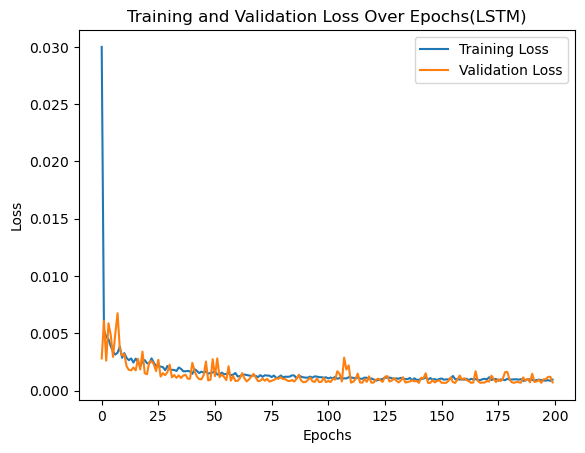

In [5]:
import matplotlib.pyplot as plt

# Evaluate the model on training data and print the training loss
# How well the model has learned the training data
train_loss = lstm_model.evaluate(X_train, y_train, verbose=0)
print(f"Training Loss: {train_loss}")

# Evaluate the model on testing data and print the test loss
# How well the model generalizes to unseen data.
test_loss = lstm_model.evaluate(X_test, y_test, verbose=0)
print(f"Test Loss: {test_loss}")

# Plot the training and validation loss over epochs to visualize the learning process
plt.plot(lstm_history.history['loss'], label='Training Loss')
plt.plot(lstm_history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss Over Epochs(LSTM)')  
plt.xlabel('Epochs')  
plt.ylabel('Loss')  
plt.legend()
plt.show()


12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step
Mean Squared Error: 2364013.6776898294
Mean Absolute Error: 1039.2621429804062
Mean Absolute Percentage Error (MAPE): 1.954379917558895%
R-squared: 0.9899690752867701


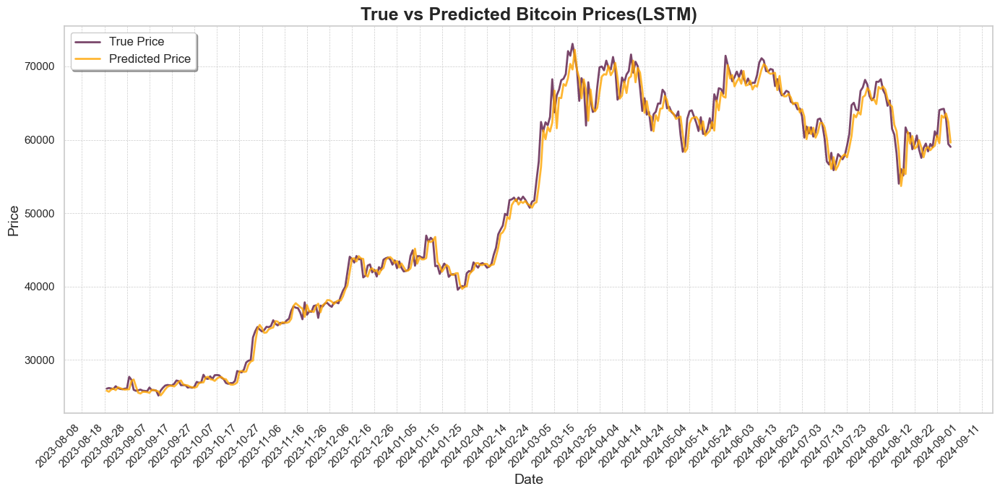

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.dates as mdates
import seaborn as sns
# Make predictions on the test set
y_test_pred = lstm_model.predict(X_test)

# Reshape y_test and y_test_pred to 2D arrays for inverse transformation
y_test_pred_reshaped = y_test_pred.reshape(-1, 1)
y_test_reshaped = y_test.reshape(-1, 1)

# Create dummy arrays for other features (zeros) for inverse transformation (excluding close price)
dummy_array_before_close = np.zeros((y_test_pred_reshaped.shape[0], len(features) - 2))  # For columns before the Close price
dummy_array_after_close = np.zeros((y_test_pred_reshaped.shape[0], 1))  # For columns after the Close price

# Combine dummy arrays with actual 'Close' price predictions for inverse transformation
# Insert the predicted 'Close' price in the second last column (before the last feature)
y_test_pred_combined = np.hstack((
    dummy_array_before_close,  # Features before 'Close'
    y_test_pred_reshaped,      # 'Close' price predictions
    dummy_array_after_close    # Features after 'Close'
))

y_test_combined = np.hstack((
    dummy_array_before_close,  # Features before 'Close'
    y_test_reshaped,           # Actual 'Close' prices
    dummy_array_after_close    # Features after 'Close'
))

# Perform inverse transformation to get actual 'Close' prices from the scaled values
y_test_pred_inverse = scaler.inverse_transform(y_test_pred_combined)[:, -2]  # Extract the predicted 'Close' price
y_test_inverse = scaler.inverse_transform(y_test_combined)[:, -2]  # Extract column that corresponds to the actual 'Close' price


# Calculate evaluation metrics to assess model performance
mse = mean_squared_error(y_test_inverse, y_test_pred_inverse)  # Mean Squared Error
mae = mean_absolute_error(y_test_inverse, y_test_pred_inverse)  # Mean Absolute Error
mape = np.mean(np.abs((y_test_inverse - y_test_pred_inverse) / y_test_inverse)) * 100
r2 = r2_score(y_test_inverse, y_test_pred_inverse)  # R-squared


# Print evaluation metrics
print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Error: {mae}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")
print(f"R-squared: {r2}")

# Convert dates for x-axis
dates = date_data['Date'].iloc[-len(y_test_inverse):]

# Set the seaborn style for better aesthetics
sns.set(style="whitegrid")

# Plot the true vs predicted values to visualize model accuracy
plt.figure(figsize=(14, 7))
plt.plot(dates, y_test_inverse, label='True Price', color='#581845', linestyle='-', linewidth=2, alpha=0.8)  
plt.plot(dates, y_test_pred_inverse, label='Predicted Price', color='#FFA500', linestyle='-', linewidth=2, alpha=0.8)  

# Set x-axis to show dates properly
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=10))  # Adjust the interval for fewer ticks
plt.gcf().autofmt_xdate(rotation=45, ha='right')  # Rotate date labels for better readability

# Set y-axis to display true price values
plt.ylabel('Price')  # Remove the previous y-axis formatting

# Add title and labels
plt.title('True vs Predicted Bitcoin Prices(LSTM)', fontsize=18, fontweight='bold')
plt.xlabel('Date', fontsize=14)
plt.ylabel('Price', fontsize=14)

# Add a grid and legend
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.legend(fontsize=12, loc='upper left', frameon=True, shadow=True)

# Display the plot
plt.tight_layout()
plt.show()


In [7]:
import numpy as np

def exponential_moving_average(data, alpha=0.1):
    """
    Calculate the Exponential Moving Average (EMA) for a given data series.
    """
    ema = [data[0]]  # EMA starts with the first data point
    for point in data[1:]:
        ema.append(alpha * point + (1 - alpha) * ema[-1])
    return ema

# Predict the next 14 days
lst_output = []
n_steps = seq_length
i = 0
pred_days = 14
alpha = 0.1  # Smoothing factor for EMA


# Take the last sequence from the test set and reshape it into a 2D array
x_input = X_test[-1].reshape(1, n_steps, len(features))
# Convert the first row of x_input into a list for easier manipulation
temp_input = x_input[0].tolist()



while i < pred_days:
    # Reshape temp_input back to the shape the model expects
    x_input = np.array(temp_input).reshape(1, n_steps, len(features))
    
    # Predict the next day's 'Close' price
    yhat = lstm_model.predict(x_input, verbose=0)

    # Calculate the EMA of the last n_steps days for other features
    new_row = []
    for feature_index in range(len(features)):
        feature_data = [day[feature_index] for day in temp_input]
        ema_value = exponential_moving_average(feature_data, alpha)[-1]
        new_row.append(ema_value)
    new_row[3] = yhat[0][0]  # Update the 'Close' price (4th feature) with the predicted value

    # Update temp_input by removing the oldest row and adding the new row
    temp_input.append(new_row)  # Add the new row
    temp_input.pop(0)  # Remove the oldest row to maintain the sequence length

    # Add the predicted value to the output list
    lst_output.extend(yhat.tolist())
    
    # Increment the counter
    i += 1


print("Output of predicted next days: ", len(lst_output))

Output of predicted next days:  14


In [8]:
import plotly.express as px
from itertools import cycle

last_days = np.arange(1, n_steps + 1) 
day_pred = np.arange(n_steps + 1, n_steps + pred_days + 1) 

# Initialize a matrix to hold values, filled with NaNs in 2D arrays
temp_mat = np.empty((len(last_days) + pred_days, 1))
temp_mat[:] = np.nan

# Copy the matrix to hold original and predicted values
last_original_days_value = temp_mat.copy()
next_predicted_days_value = temp_mat.copy()

# Populate the original days values with actual prices
last_original_days_value[0:n_steps] = scaler.inverse_transform(
    np.hstack((scaled_data[-n_steps:, :-1], scaled_data[-n_steps:, -1].reshape(-1, 1)))
)[:, 3].reshape(-1, 1)

# Extend lst_output to have the same number of features as original data
extended_output = np.zeros((pred_days, len(features)))
extended_output[:, 3] = np.array(lst_output).reshape(-1)

# Populate the predicted days values
next_predicted_days_value[n_steps:] = scaler.inverse_transform(extended_output)[:, 3].reshape(-1, 1)

# Create DataFrame for plotting
dates = pd.date_range(start=date_data['Date'].iloc[-n_steps], periods=n_steps + pred_days, freq='D')
new_pred_plot = pd.DataFrame({
    'Date': dates,
    'Last 14 days close price': last_original_days_value.flatten(),
    'Predicted next 14 days close price': next_predicted_days_value.flatten()
})

# Create a melted DataFrame for easy plotting
new_pred_plot_melted = new_pred_plot.melt(id_vars=['Date'], value_vars=['Last 14 days close price', 
                                                                        'Predicted next 14 days close price'], 
                                                                          var_name='Type', value_name='Price')

# Plotting with custom colors
fig = px.line(new_pred_plot_melted, x='Date', y='Price', color='Type',
              labels={'Price': 'Bitcoin price', 'Date': 'Date'},
              color_discrete_map={
                  'Last 14 days close price': '#8c8987',  # Custom color for last 14 days
                  'Predicted next 14 days close price': '#ff9c24'  # Custom color for next 14 days
              })

# Update layout to include gridlines for both axes
fig.update_layout(
    title_text='Compare last 14 days vs next 14 days(LSTM)',
    plot_bgcolor='white',
    font_size=15,
    font_color='black',
    legend_title_text='Close Price',
    xaxis=dict(
        showgrid=True,  # Show gridlines on x-axis
        gridcolor='lightgray',  # Color of gridlines
        gridwidth=0.5  # Thickness of gridlines
    ),
    yaxis=dict(
        showgrid=True,  # Show gridlines on y-axis
        gridcolor='lightgray',  # Color of gridlines
        gridwidth=0.5  # Thickness of gridlines
    ),
    legend=dict(
        font=dict(size=14),  # Adjust legend font size to be smaller
        orientation="h",  # Horizontal orientation
        yanchor="bottom",  # Position the legend at the bottom
        y=0.95,
        xanchor="right",
        x=1
    )
)

fig.show()


# Output the predicted prices for the next 14 days
predicted_prices = pd.DataFrame({
    'Date': dates[-pred_days:],
    'Predicted Close Price': next_predicted_days_value[-pred_days:].flatten()
})

print("Predicted Close Prices for the Next 14 Days:")
print(predicted_prices)


Predicted Close Prices for the Next 14 Days:
         Date  Predicted Close Price
0  2024-08-29           59620.503913
1  2024-08-30           60412.345305
2  2024-08-31           60210.341814
3  2024-09-01           60227.009535
4  2024-09-02           60271.989503
5  2024-09-03           60302.616995
6  2024-09-04           60253.908047
7  2024-09-05           60355.884723
8  2024-09-06           60460.641060
9  2024-09-07           60361.515756
10 2024-09-08           60715.919109
11 2024-09-09           60915.023421
12 2024-09-10           61033.063395
13 2024-09-11           60980.321548


In [9]:
import pandas as pd
import numpy as np
import plotly.express as px
# Inverse transform the predicted values for the next 14 days
predicted_values = scaler.inverse_transform(extended_output)[:, 3]

# Create a DataFrame for plotting
plot_df = pd.DataFrame({
    'Date': pd.concat([date_data['Date'], pd.Series(pd.date_range(start=date_data['Date'].iloc[-1], periods=pred_days + 1, 
                                                                  freq='D')[1:])]).reset_index(drop=True),
    'Close Price': np.concatenate([data['Close'], predicted_values]),
    'Type': ['Original'] * len(data) + ['Predicted'] * pred_days
})

# Plotting with Plotly
fig = px.line(plot_df, x='Date', y='Close Price', color='Type',
              labels={'Close Price': 'Bitcoin Price', 'Date': 'Date'},
              title='Entire Closing Price with Next 14 Days Prediction')

# Customize the layout
fig.update_layout(
    title_text='Entire Closing Price with Next 14 Days Prediction based LSTM',
    title_x=0.5,
    plot_bgcolor='white',
    font=dict(size=15, color='black'),
    legend_title_text='Price Type'
)

# Add a vertical line to separate original data from predictions
fig.add_shape(type="line",
              x0=date_data['Date'].iloc[-1], y0=0, x1=date_data['Date'].iloc[-1], y1=1,
              line=dict(color="Gray", width=1.5, dash="dash"),
              xref='x', yref='paper')

# Add annotation
fig.add_annotation(x=date_data['Date'].iloc[-1], y=data['Close'].iloc[-1],
                   text='Prediction Start',
                   showarrow=True,
                   arrowhead=2,
                   ax=0, ay=-40)

# Show plot
fig.show()


## LSTM with Hyperparameter tuning


In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler

def load_and_prepare_data(file_path, features, seq_length=14, train_split=0.7):
    # Load the data from a CSV file
    data = pd.read_csv(file_path)

    # Convert 'Date' column to datetime format
    data['Date'] = pd.to_datetime(data['Date'])

    # Extract date and feature data
    date_data = data[['Date']]
    data = data[features]

    # Normalize the data to range [0, 1] to ensure all features contribute equally to the model
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(data)

    # Function to create sequences of the specified length (seq_length) from the data
    def create_sequences(data, seq_length):
        xs, ys = [], []
        for i in range(len(data) - seq_length):
            x = data[i:i+seq_length]  # Input sequence
            y = data[i+seq_length][3]  # Output value (Close price at the next time step)
            xs.append(x)
            ys.append(y)
        return np.array(xs), np.array(ys)

    # Create sequences
    X, y = create_sequences(scaled_data, seq_length)

    # Split the data into training and testing sets (70% train, 30% test)
    split = int(train_split * len(X))
    X_train, X_test = X[:split], X[split:]
    y_train, y_test = y[:split], y[split:]

    return X_train, X_test, y_train, y_test, scaler, date_data, scaled_data, data

# Example of how to use the function
file_path = 'merged_data.csv'
features = ['Open', 'High', 'Low', 'Close', 'Sentiment_score']
seq_length = 14

X_train, X_test, y_train, y_test, scaler, date_data, scaled_data, data = load_and_prepare_data(file_path, features, seq_length)
# Print the shapes of training and testing sets to verify the split
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(876, 14, 5) (376, 14, 5) (876,) (376,)


In [1]:
import kerastuner as kt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dropout, Dense, Input
from tensorflow.keras.optimizers import Adam

# Define a function that builds the LSTM model
def lstm_tune_model(hp):
    model = Sequential()
    
    # Add the first LSTM layer with tunable units and return_sequences=True
    model.add(LSTM(units=hp.Int('units1', min_value=32, max_value=512, step=32),
                   return_sequences=True, input_shape=(seq_length, len(features))))
    
    # Add the first Dropout layer with a tunable dropout rate
    model.add(Dropout(rate=hp.Float('dropout1', min_value=0.1, max_value=0.5, step=0.1)))
    
    # Add the second LSTM layer with tunable units and return_sequences=False
    model.add(LSTM(units=hp.Int('units2', min_value=32, max_value=512, step=32), return_sequences=False))
    
    # Add the second Dropout layer with a tunable dropout rate
    model.add(Dropout(rate=hp.Float('dropout2', min_value=0.1, max_value=0.5, step=0.1)))
    
    # Add a Dense layer with tunable units
    model.add(Dense(units=hp.Int('dense_units', min_value=5, max_value=512, step=5), activation='relu'))
    
    # Add the output layer
    model.add(Dense(1))
    
    # Compile the model with Adam optimizer and mean squared error loss
    model.compile(optimizer='adam', loss='mean_squared_error')
    
    return model

C:\Users\davej\AppData\Local\Temp\ipykernel_26840\904006712.py:1: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  import kerastuner as kt


In [3]:
# Initialize the Hyperband tuner with the LSTM model building function
tuner = kt.Hyperband(
    lstm_tune_model,
    objective='val_loss',
    max_epochs=50,  # Maximum number of epochs to train each model
    factor=3,  # Factor by which the number of training epochs is reduced in each round
    directory='my_dir',  # Directory to save results
    project_name='lstm_hyperparameter_tuning'
)

C:\Users\davej\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [4]:
# Search for the best hyperparameters using the training and validation data
tuner.search(X_train, y_train, epochs=50, validation_data=(X_test, y_test))

Trial 88 Complete [00h 01m 37s]
val_loss: 0.0010402171174064279

Best val_loss So Far: 0.0007214184734039009
Total elapsed time: 00h 29m 49s


In [5]:
# Retrieve the best hyperparameters
best_lstm_hyperparameters = tuner.get_best_hyperparameters(num_trials=1)[0]

# Print the best hyperparameters
print("Best Hyperparameters:")
print(f"Units (LSTM Layer 1): {best_lstm_hyperparameters.get('units1')}")
print(f"Dropout Rate 1: {best_lstm_hyperparameters.get('dropout1')}")
print(f"Units (LSTM Layer 2): {best_lstm_hyperparameters.get('units2')}")
print(f"Dropout Rate 2: {best_lstm_hyperparameters.get('dropout2')}")
print(f"Dense Units: {best_lstm_hyperparameters.get('dense_units')}")

Best Hyperparameters:
Units (LSTM Layer 1): 192
Dropout Rate 1: 0.2
Units (LSTM Layer 2): 480
Dropout Rate 2: 0.2
Dense Units: 45


In [6]:
# Get the Best Model
best_lstm_model = tuner.get_best_models(num_models=1)[0]

best_lstm_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 14, 192)             │         152,064 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 14, 192)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 480)                 │       1,292,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 480)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 45)                  │          21,645 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              46 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,465,915 (5.59 MB)

 Trainable params: 1,465,915 (5.59 MB)

 Non-trainable params: 0 (0.00 B)

In [4]:
# train the best model with the best hyperparameters 
lstm_tune_history = best_lstm_model.fit(X_train, y_train, epochs=200, batch_size=32, validation_data=(X_test, y_test))

Epoch 1/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - loss: 0.0462 - val_loss: 0.0128
Epoch 2/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.0034 - val_loss: 0.0044
Epoch 3/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.0025 - val_loss: 0.0026
Epoch 4/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.0020 - val_loss: 0.0050
Epoch 5/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0023 - val_loss: 0.0030
Epoch 6/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0021 - val_loss: 0.0030
Epoch 7/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0021 - val_loss: 0.0031
Epoch 8/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 9/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0018 - val_loss: 0.0033
Epoch 10/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0026 - val_loss: 0.0017
Epoch 11/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 12/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step

In [8]:
best_lstm_model.save('lstm_tuned_model.h5')


Training Loss: 0.0005230875103734434
Test Loss: 0.0006807512254454195


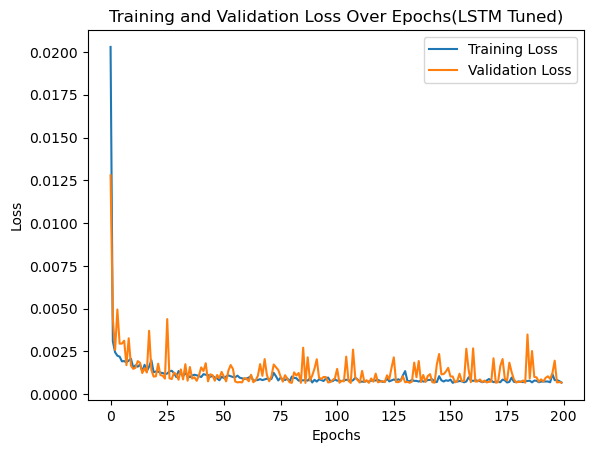

In [5]:
import matplotlib.pyplot as plt

# Evaluate the model on training data and print the training loss
# How well the model has learned the training data
train_loss = best_lstm_model.evaluate(X_train, y_train, verbose=0)
print(f"Training Loss: {train_loss}")

# Evaluate the model on testing data and print the test loss
# How well the model generalizes to unseen data.
test_loss = best_lstm_model.evaluate(X_test, y_test, verbose=0)
print(f"Test Loss: {test_loss}")

# Plot the training and validation loss over epochs to visualize the learning process
plt.plot(lstm_tune_history.history['loss'], label='Training Loss')
plt.plot(lstm_tune_history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss Over Epochs(LSTM Tuned)')  
plt.xlabel('Epochs')  
plt.ylabel('Loss')  
plt.legend()
plt.show()


12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step
Mean Squared Error: 2234410.848382083
Mean Absolute Error: 1017.6176920383286
Mean Absolute Percentage Error (MAPE): 1.9281157112177174%
R-squared: 0.9905190028255474


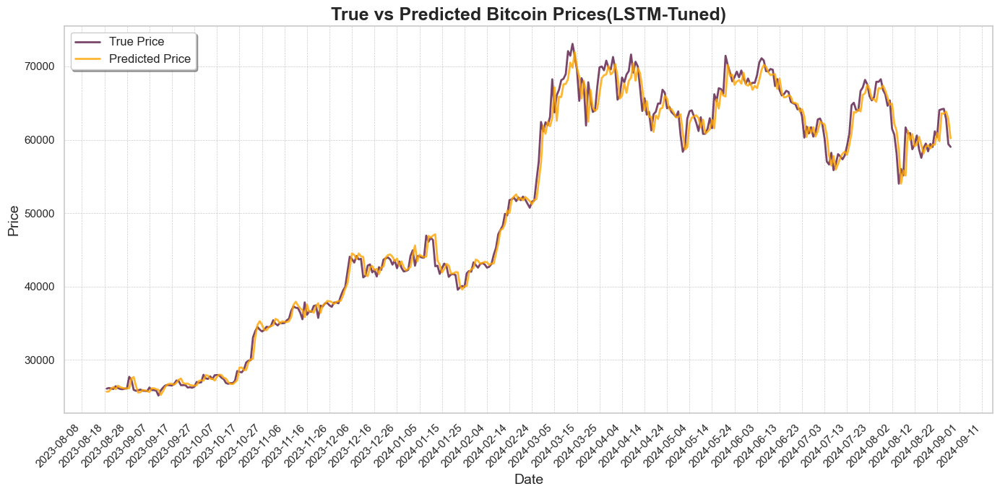

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.dates as mdates
import seaborn as sns
# Make predictions on the test set
y_test_pred = best_lstm_model.predict(X_test)

# Reshape y_test and y_test_pred to 2D arrays for inverse transformation
y_test_pred_reshaped = y_test_pred.reshape(-1, 1)
y_test_reshaped = y_test.reshape(-1, 1)

# Create dummy arrays for other features (zeros) for inverse transformation (excluding close price)
dummy_array_before_close = np.zeros((y_test_pred_reshaped.shape[0], len(features) - 2))  # For columns before the Close price
dummy_array_after_close = np.zeros((y_test_pred_reshaped.shape[0], 1))  # For columns after the Close price

# Combine dummy arrays with actual 'Close' price predictions for inverse transformation
# Insert the predicted 'Close' price in the second last column (before the last feature)
y_test_pred_combined = np.hstack((
    dummy_array_before_close,  # Features before 'Close'
    y_test_pred_reshaped,      # 'Close' price predictions
    dummy_array_after_close    # Features after 'Close'
))

y_test_combined = np.hstack((
    dummy_array_before_close,  # Features before 'Close'
    y_test_reshaped,           # Actual 'Close' prices
    dummy_array_after_close    # Features after 'Close'
))

# Perform inverse transformation to get actual 'Close' prices from the scaled values
y_test_pred_inverse = scaler.inverse_transform(y_test_pred_combined)[:, -2]  # Extract the predicted 'Close' price
y_test_inverse = scaler.inverse_transform(y_test_combined)[:, -2]  # Extract column that corresponds to the actual 'Close' price

# Calculate evaluation metrics to assess model performance
mse = mean_squared_error(y_test_inverse, y_test_pred_inverse)  # Mean Squared Error
mae = mean_absolute_error(y_test_inverse, y_test_pred_inverse)  # Mean Absolute Error
mape = np.mean(np.abs((y_test_inverse - y_test_pred_inverse) / y_test_inverse)) * 100
r2 = r2_score(y_test_inverse, y_test_pred_inverse)  # R-squared


# Print evaluation metrics
print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Error: {mae}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")
print(f"R-squared: {r2}")

# Convert dates for x-axis
dates = date_data['Date'].iloc[-len(y_test_inverse):]

# Set the seaborn style for better aesthetics
sns.set(style="whitegrid")

# Plot the true vs predicted values to visualize model accuracy
plt.figure(figsize=(14, 7))
plt.plot(dates, y_test_inverse, label='True Price', color='#581845', linestyle='-', linewidth=2, alpha=0.8)  # Bright Cyan
plt.plot(dates, y_test_pred_inverse, label='Predicted Price', color='#FFA500', linestyle='-', linewidth=2, alpha=0.8)  # Bright Magenta

# Set x-axis to show dates properly
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=10))  # Adjust the interval for fewer ticks
plt.gcf().autofmt_xdate(rotation=45, ha='right')  # Rotate date labels for better readability

# Set y-axis to display true price values
plt.ylabel('Price')  # Remove the previous y-axis formatting

# Add title and labels
plt.title('True vs Predicted Bitcoin Prices(LSTM-Tuned)', fontsize=18, fontweight='bold')
plt.xlabel('Date', fontsize=14)
plt.ylabel('Price', fontsize=14)

# Add a grid and legend
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.legend(fontsize=12, loc='upper left', frameon=True, shadow=True)

# Display the plot
plt.tight_layout()
plt.show()


In [10]:
import numpy as np

def exponential_moving_average(data, alpha=0.1):
    """
    Calculate the Exponential Moving Average (EMA) for a given data series.
    """
    ema = [data[0]]  # EMA starts with the first data point
    for point in data[1:]:
        ema.append(alpha * point + (1 - alpha) * ema[-1])
    return ema

# Predict the next 7 days
lst_output = []
n_steps = seq_length
i = 0
pred_days = 14
alpha = 0.1  # Smoothing factor for EMA


# Take the last sequence from the test set and reshape it into a 2D array
x_input = X_test[-1].reshape(1, n_steps, len(features))
# Convert the first row of x_input into a list for easier manipulation
temp_input = x_input[0].tolist()



while i < pred_days:
    # Reshape temp_input back to the shape the model expects
    x_input = np.array(temp_input).reshape(1, n_steps, len(features))
    
    # Predict the next day's 'Close' price
    yhat = best_lstm_model.predict(x_input, verbose=0)
    
#     # Print the current temp_input for debugging purposes
#     print(f"Iteration {i+1}")
#     print(f"Current temp_input: {temp_input}")
#     print(f"Predicted value: {yhat[0]}")

    # Calculate the EMA of the last n_steps days for other features
    new_row = []
    for feature_index in range(len(features)):
        feature_data = [day[feature_index] for day in temp_input]
        ema_value = exponential_moving_average(feature_data, alpha)[-1]
        new_row.append(ema_value)
    new_row[3] = yhat[0][0]  # Update the 'Close' price (4th feature) with the predicted value

    # Update temp_input by removing the oldest row and adding the new row
    temp_input.append(new_row)  # Add the new row
    temp_input.pop(0)  # Remove the oldest row to maintain the sequence length

    # Add the predicted value to the output list
    lst_output.extend(yhat.tolist())
    
    # Increment the counter
    i += 1


print("Output of predicted next days: ", len(lst_output))

Output of predicted next days:  14


In [11]:
import plotly.express as px
from itertools import cycle

last_days = np.arange(1, n_steps + 1) # 1 to 7
day_pred = np.arange(n_steps + 1, n_steps + pred_days + 1) # 8 to 14

# Initialize a matrix to hold values, filled with NaNs in 2D arrays
temp_mat = np.empty((len(last_days) + pred_days, 1))
temp_mat[:] = np.nan

# Copy the matrix to hold original and predicted values
last_original_days_value = temp_mat.copy()
next_predicted_days_value = temp_mat.copy()

# Populate the original days values with actual prices
last_original_days_value[0:n_steps] = scaler.inverse_transform(
    np.hstack((scaled_data[-n_steps:, :-1], scaled_data[-n_steps:, -1].reshape(-1, 1)))
)[:, 3].reshape(-1, 1)

# Extend lst_output to have the same number of features as original data
extended_output = np.zeros((pred_days, len(features)))
extended_output[:, 3] = np.array(lst_output).reshape(-1)

# Populate the predicted days values
next_predicted_days_value[n_steps:] = scaler.inverse_transform(extended_output)[:, 3].reshape(-1, 1)

# Create DataFrame for plotting
dates = pd.date_range(start=date_data['Date'].iloc[-n_steps], periods=n_steps + pred_days, freq='D')
new_pred_plot = pd.DataFrame({
    'Date': dates,
    'Last 14 days close price': last_original_days_value.flatten(),
    'Predicted next 14 days close price': next_predicted_days_value.flatten()
})

# Create a melted DataFrame for easy plotting
new_pred_plot_melted = new_pred_plot.melt(id_vars=['Date'], value_vars=['Last 14 days close price', 'Predicted next 14 days close price'], var_name='Type', value_name='Price')

# Plotting with custom colors
fig = px.line(new_pred_plot_melted, x='Date', y='Price', color='Type',
              labels={'Price': 'Bitcoin price', 'Date': 'Date'},
              color_discrete_map={
                  'Last 14 days close price': '#8c8987',  # Custom color for last 14 days
                  'Predicted next 14 days close price': '#ff9c24'  # Custom color for next 14 days
              })

# Update layout to include gridlines for both axes
fig.update_layout(
    title_text='Compare last 14 days vs next 14 days(LSTM-Tuned)',
    plot_bgcolor='white',
    font_size=15,
    font_color='black',
    legend_title_text='Close Price',
    xaxis=dict(
        showgrid=True,  # Show gridlines on x-axis
        gridcolor='lightgray',  # Color of gridlines
        gridwidth=0.5  # Thickness of gridlines
    ),
    yaxis=dict(
        showgrid=True,  # Show gridlines on y-axis
        gridcolor='lightgray',  # Color of gridlines
        gridwidth=0.5  # Thickness of gridlines
    ),
    legend=dict(
        font=dict(size=14),  # Adjust legend font size to be smaller
        orientation="h",  # Horizontal orientation
        yanchor="bottom",  # Position the legend at the bottom
        y=0.95,
        xanchor="right",
        x=1
    )
)

fig.show()


# Output the predicted prices for the next 14 days
predicted_prices = pd.DataFrame({
    'Date': dates[-pred_days:],
    'Predicted Close Price': next_predicted_days_value[-pred_days:].flatten()
})

print("Predicted Close Prices for the Next 14 Days:")
print(predicted_prices)


Predicted Close Prices for the Next 14 Days:
         Date  Predicted Close Price
0  2024-08-29           60198.065547
1  2024-08-30           60958.914062
2  2024-08-31           60796.706846
3  2024-09-01           60702.017389
4  2024-09-02           60712.763818
5  2024-09-03           60766.728169
6  2024-09-04           60744.846022
7  2024-09-05           60844.862593
8  2024-09-06           60946.050446
9  2024-09-07           60901.422205
10 2024-09-08           61181.075217
11 2024-09-09           61464.071334
12 2024-09-10           61591.143499
13 2024-09-11           61628.532329


In [12]:
import pandas as pd
import numpy as np
import plotly.express as px
# Inverse transform the predicted values for the next 7 days
predicted_values = scaler.inverse_transform(extended_output)[:, 3]

# Create a DataFrame for plotting
plot_df = pd.DataFrame({
    'Date': pd.concat([date_data['Date'], pd.Series(pd.date_range(start=date_data['Date'].iloc[-1], periods=pred_days + 1, freq='D')[1:])]).reset_index(drop=True),
    'Close Price': np.concatenate([data['Close'], predicted_values]),
    'Type': ['Original'] * len(data) + ['Predicted'] * pred_days
})

# Plotting with Plotly
fig = px.line(plot_df, x='Date', y='Close Price', color='Type',
              labels={'Close Price': 'Bitcoin Price', 'Date': 'Date'},
              title='Entire Closing Price with Next 14 Days Prediction')

# Customize the layout
fig.update_layout(
    title_text='Entire Closing Price with Next 14 Days Prediction based LSTM-Tuned',
    title_x=0.5,
    plot_bgcolor='white',
    font=dict(size=15, color='black'),
    legend_title_text='Price Type'
)

# Add a vertical line to separate original data from predictions
fig.add_shape(type="line",
              x0=date_data['Date'].iloc[-1], y0=0, x1=date_data['Date'].iloc[-1], y1=1,
              line=dict(color="Gray", width=1.5, dash="dash"),
              xref='x', yref='paper')

# Add annotation
fig.add_annotation(x=date_data['Date'].iloc[-1], y=data['Close'].iloc[-1],
                   text='Prediction Start',
                   showarrow=True,
                   arrowhead=2,
                   ax=0, ay=-40)

# Show plot
fig.show()


## Hybrid LSTM-GRU


In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

# Load the data from a CSV file
file_path = 'merged_data.csv'
data = pd.read_csv(file_path)

# Convert 'Date' column to datetime format for better handling of date-related operations
data['Date'] = pd.to_datetime(data['Date'])

# Select relevant features for the model
features = ['Open', 'High', 'Low', 'Close', 'Sentiment_score']
# features = ['Open', 'High', 'Low', 'Close']  # Use only price features for now

# Extract date and feature data
date_data = data[['Date']]
data = data[features]

# Normalize the data to range [0, 1] to ensure all features contribute equally to the model
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(data)

# Function to create sequences of the specified length (seq_length) from the data
def create_sequences(data, seq_length):
    # Store input sequence and output values
    xs, ys = [], []
    for i in range(len(data) - seq_length):
        x = data[i:i+seq_length]  # Input sequence
        y = data[i+seq_length][3]  # Output value (Close price at the next time step)
        xs.append(x)
        ys.append(y)
    return np.array(xs), np.array(ys)

# Set sequence length (window period) to 7 days
seq_length = 14
X, y = create_sequences(scaled_data, seq_length)

# Split the data into training and testing sets (70% train, 30% test)
split = int(0.7 * len(X))
X_train, X_test = X[:split], X[split:]
y_train, y_test = y[:split], y[split:]

# Print the shapes of training and testing sets to verify the split
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(876, 14, 5) (376, 14, 5) (876,) (376,)


In [2]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, GRU, Dense, Dropout
from tensorflow.keras.optimizers import Adam

# Define the stacked LSTM-GRU model
def build_hybrid_lstm_gru_model(input_shape):
    model = Sequential()
    
    # LSTM layer
    model.add(LSTM(units=50, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(0.2))

    # GRU layer
    model.add(GRU(units=50, return_sequences=False))
    model.add(Dropout(0.2))
    
    # Fully connected Dense layer
    model.add(Dense(5, activation='relu'))
    
    # Output layer
    model.add(Dense(1))
    
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error')
    
    return model

input_shape = (seq_length, len(features))

hybrid_lstm_gru_model = build_hybrid_lstm_gru_model(input_shape)

# Print the model summary
hybrid_lstm_gru_model.summary()

C:\Users\davej\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 14, 50)              │          11,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 14, 50)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gru (GRU)                            │ (None, 50)                  │          15,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 50)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 5)                   │             255 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │               6 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 26,761 (104.54 KB)

 Trainable params: 26,761 (104.54 KB)

 Non-trainable params: 0 (0.00 B)

In [3]:
# Train the model
hybrid_history = hybrid_lstm_gru_model.fit(X_train, y_train, epochs=200, batch_size=32, validation_data=(X_test, y_test))


Epoch 1/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0532 - val_loss: 0.0039
Epoch 2/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0043 - val_loss: 0.0039
Epoch 3/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0047 - val_loss: 0.0028
Epoch 4/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0036 - val_loss: 0.0040
Epoch 5/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0032 - val_loss: 0.0064
Epoch 6/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0036 - val_loss: 0.0024
Epoch 7/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0037 - val_loss: 0.0021
Epoch 8/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0033 - val_loss: 0.0019
Epoch 9/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0032 - val_loss: 0.0038
Epoch 10/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0030 - val_loss: 0.0037
Epoch 11/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 12/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.

In [4]:
hybrid_lstm_gru_model.save('hybrid_lstm_gru_model.h5')


Training Loss: 0.0007099951035343111
Test Loss: 0.0013561712112277746


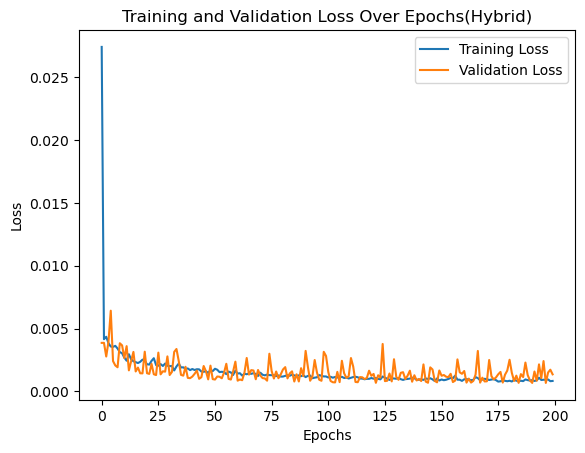

In [5]:
import matplotlib.pyplot as plt

# Evaluate the model on training data and print the training loss
# How well the model has learned the training data
train_loss = hybrid_lstm_gru_model.evaluate(X_train, y_train, verbose=0)
print(f"Training Loss: {train_loss}")

# Evaluate the model on testing data and print the test loss
# How well the model generalizes to unseen data.
test_loss = hybrid_lstm_gru_model.evaluate(X_test, y_test, verbose=0)
print(f"Test Loss: {test_loss}")

# Plot the training and validation loss over epochs to visualize the learning process
plt.plot(hybrid_history.history['loss'], label='Training Loss')
plt.plot(hybrid_history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss Over Epochs(Hybrid)')  
plt.xlabel('Epochs')  
plt.ylabel('Loss')  
plt.legend()
plt.show()



12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step
Mean Squared Error: 4451323.152014441
Mean Absolute Error: 1639.6836324284805
Mean Absolute Percentage Error (MAPE): 3.165967363298579%
R-squared: 0.9811122550459405


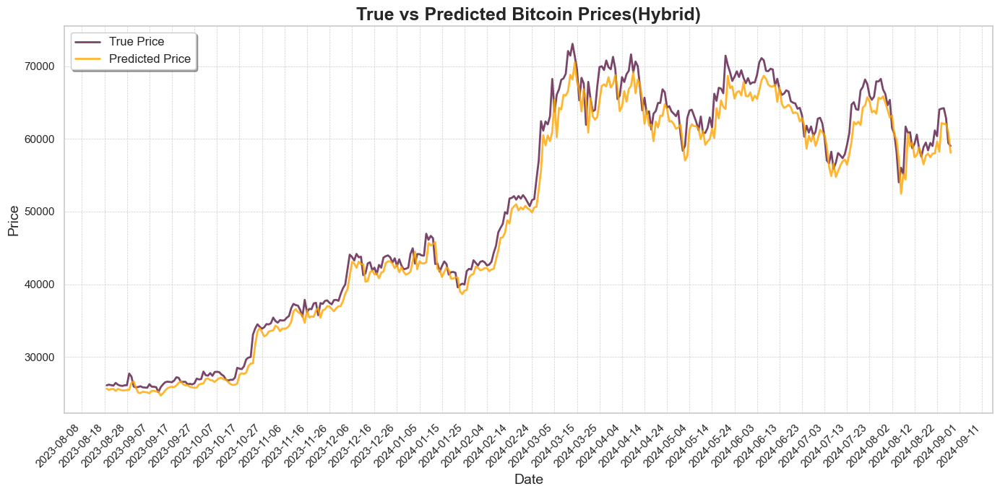

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.dates as mdates
import seaborn as sns
# Make predictions on the test set
y_test_pred = hybrid_lstm_gru_model.predict(X_test)

# Reshape y_test and y_test_pred to 2D arrays for inverse transformation
y_test_pred_reshaped = y_test_pred.reshape(-1, 1)
y_test_reshaped = y_test.reshape(-1, 1)

# Create dummy arrays for other features (zeros) for inverse transformation (excluding close price)
dummy_array_before_close = np.zeros((y_test_pred_reshaped.shape[0], len(features) - 2))  # For columns before the Close price
dummy_array_after_close = np.zeros((y_test_pred_reshaped.shape[0], 1))  # For columns after the Close price

# Combine dummy arrays with actual 'Close' price predictions for inverse transformation
# Insert the predicted 'Close' price in the second last column (before the last feature)
y_test_pred_combined = np.hstack((
    dummy_array_before_close,  # Features before 'Close'
    y_test_pred_reshaped,      # 'Close' price predictions
    dummy_array_after_close    # Features after 'Close'
))

y_test_combined = np.hstack((
    dummy_array_before_close,  # Features before 'Close'
    y_test_reshaped,           # Actual 'Close' prices
    dummy_array_after_close    # Features after 'Close'
))

# Perform inverse transformation to get actual 'Close' prices from the scaled values
y_test_pred_inverse = scaler.inverse_transform(y_test_pred_combined)[:, -2]  # Extract the predicted 'Close' price
y_test_inverse = scaler.inverse_transform(y_test_combined)[:, -2]  # Extract column that corresponds to the actual 'Close' price



# Calculate evaluation metrics to assess model performance
mse = mean_squared_error(y_test_inverse, y_test_pred_inverse)  # Mean Squared Error
mae = mean_absolute_error(y_test_inverse, y_test_pred_inverse)  # Mean Absolute Error
mape = np.mean(np.abs((y_test_inverse - y_test_pred_inverse) / y_test_inverse)) * 100
r2 = r2_score(y_test_inverse, y_test_pred_inverse)  # R-squared


# Print evaluation metrics
print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Error: {mae}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")
print(f"R-squared: {r2}")

# Convert dates for x-axis
dates = date_data['Date'].iloc[-len(y_test_inverse):]

# Set the seaborn style for better aesthetics
sns.set(style="whitegrid")

# Plot the true vs predicted values to visualize model accuracy
plt.figure(figsize=(14, 7))
plt.plot(dates, y_test_inverse, label='True Price', color='#581845', linestyle='-', linewidth=2, alpha=0.8)  # Bright Cyan
plt.plot(dates, y_test_pred_inverse, label='Predicted Price', color='#FFA500', linestyle='-', linewidth=2, alpha=0.8)  # Bright Magenta

# Set x-axis to show dates properly
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=10))  # Adjust the interval for fewer ticks
plt.gcf().autofmt_xdate(rotation=45, ha='right')  # Rotate date labels for better readability

# Set y-axis to display true price values
plt.ylabel('Price')  # Remove the previous y-axis formatting

# Add title and labels
plt.title('True vs Predicted Bitcoin Prices(Hybrid)', fontsize=18, fontweight='bold')
plt.xlabel('Date', fontsize=14)
plt.ylabel('Price', fontsize=14)

# Add a grid and legend
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.legend(fontsize=12, loc='upper left', frameon=True, shadow=True)

# Display the plot
plt.tight_layout()
plt.show()


In [7]:
import numpy as np

def exponential_moving_average(data, alpha=0.1):
    """
    Calculate the Exponential Moving Average (EMA) for a given data series.
    """
    ema = [data[0]]  # EMA starts with the first data point
    for point in data[1:]:
        ema.append(alpha * point + (1 - alpha) * ema[-1])
    return ema

# Predict the next 7 days
lst_output = []
n_steps = seq_length
i = 0
pred_days = 14
alpha = 0.1  # Smoothing factor for EMA


# Take the last sequence from the test set and reshape it into a 2D array
x_input = X_test[-1].reshape(1, n_steps, len(features))
# Convert the first row of x_input into a list for easier manipulation
temp_input = x_input[0].tolist()



while i < pred_days:
    # Reshape temp_input back to the shape the model expects
    x_input = np.array(temp_input).reshape(1, n_steps, len(features))
    
    # Predict the next day's 'Close' price
    yhat = hybrid_lstm_gru_model.predict(x_input, verbose=0)
    
#     # Print the current temp_input for debugging purposes
#     print(f"Iteration {i+1}")
#     print(f"Current temp_input: {temp_input}")
#     print(f"Predicted value: {yhat[0]}")

    # Calculate the EMA of the last n_steps days for other features
    new_row = []
    for feature_index in range(len(features)):
        feature_data = [day[feature_index] for day in temp_input]
        ema_value = exponential_moving_average(feature_data, alpha)[-1]
        new_row.append(ema_value)
    new_row[3] = yhat[0][0]  # Update the 'Close' price (4th feature) with the predicted value

    # Update temp_input by removing the oldest row and adding the new row
    temp_input.append(new_row)  # Add the new row
    temp_input.pop(0)  # Remove the oldest row to maintain the sequence length

    # Add the predicted value to the output list
    lst_output.extend(yhat.tolist())
    
    # Increment the counter
    i += 1


print("Output of predicted next days: ", len(lst_output))

Output of predicted next days:  14


In [8]:
import plotly.express as px
from itertools import cycle

last_days = np.arange(1, n_steps + 1) # 1 to 7
day_pred = np.arange(n_steps + 1, n_steps + pred_days + 1) # 8 to 14

# Initialize a matrix to hold values, filled with NaNs in 2D arrays
temp_mat = np.empty((len(last_days) + pred_days, 1))
temp_mat[:] = np.nan

# Copy the matrix to hold original and predicted values
last_original_days_value = temp_mat.copy()
next_predicted_days_value = temp_mat.copy()

# Populate the original days values with actual prices
last_original_days_value[0:n_steps] = scaler.inverse_transform(
    np.hstack((scaled_data[-n_steps:, :-1], scaled_data[-n_steps:, -1].reshape(-1, 1)))
)[:, 3].reshape(-1, 1)

# Extend lst_output to have the same number of features as original data
extended_output = np.zeros((pred_days, len(features)))
extended_output[:, 3] = np.array(lst_output).reshape(-1)

# Populate the predicted days values
next_predicted_days_value[n_steps:] = scaler.inverse_transform(extended_output)[:, 3].reshape(-1, 1)

# Create DataFrame for plotting
dates = pd.date_range(start=date_data['Date'].iloc[-n_steps], periods=n_steps + pred_days, freq='D')
new_pred_plot = pd.DataFrame({
    'Date': dates,
    'Last 14 days close price': last_original_days_value.flatten(),
    'Predicted next 14 days close price': next_predicted_days_value.flatten()
})

# Create a melted DataFrame for easy plotting
new_pred_plot_melted = new_pred_plot.melt(id_vars=['Date'], value_vars=['Last 14 days close price', 'Predicted next 14 days close price'], var_name='Type', value_name='Price')

# Plotting with custom colors
fig = px.line(new_pred_plot_melted, x='Date', y='Price', color='Type',
              labels={'Price': 'Bitcoin price', 'Date': 'Date'},
              color_discrete_map={
                  'Last 14 days close price': '#8c8987',  # Custom color for last 14 days
                  'Predicted next 14 days close price': '#ff9c24'  # Custom color for next 14 days
              })

# Update layout to include gridlines for both axes
fig.update_layout(
    title_text='Compare last 14 days vs next 14 days(Hybrid)',
    plot_bgcolor='white',
    font_size=15,
    font_color='black',
    legend_title_text='Close Price',
    xaxis=dict(
        showgrid=True,  # Show gridlines on x-axis
        gridcolor='lightgray',  # Color of gridlines
        gridwidth=0.5  # Thickness of gridlines
    ),
    yaxis=dict(
        showgrid=True,  # Show gridlines on y-axis
        gridcolor='lightgray',  # Color of gridlines
        gridwidth=0.5  # Thickness of gridlines
    ),
    legend=dict(
        font=dict(size=14),  # Adjust legend font size to be smaller
        orientation="h",  # Horizontal orientation
        yanchor="bottom",  # Position the legend at the bottom
        y=0.95,
        xanchor="right",
        x=1
    )
)

fig.show()


# Output the predicted prices for the next 14 days
predicted_prices = pd.DataFrame({
    'Date': dates[-pred_days:],
    'Predicted Close Price': next_predicted_days_value[-pred_days:].flatten()
})

print("Predicted Close Prices for the Next 14 Days:")
print(predicted_prices)


Predicted Close Prices for the Next 14 Days:
         Date  Predicted Close Price
0  2024-08-29           58100.995783
1  2024-08-30           58151.838991
2  2024-08-31           57926.549863
3  2024-09-01           57929.636858
4  2024-09-02           57998.609329
5  2024-09-03           58087.227241
6  2024-09-04           58048.260766
7  2024-09-05           58115.126295
8  2024-09-06           58192.068948
9  2024-09-07           58060.226284
10 2024-09-08           58316.788304
11 2024-09-09           58609.089797
12 2024-09-10           58662.159466
13 2024-09-11           58577.475423


In [9]:
import pandas as pd
import numpy as np
import plotly.express as px
# Inverse transform the predicted values for the next 7 days
predicted_values = scaler.inverse_transform(extended_output)[:, 3]

# Create a DataFrame for plotting
plot_df = pd.DataFrame({
    'Date': pd.concat([date_data['Date'], pd.Series(pd.date_range(start=date_data['Date'].iloc[-1], periods=pred_days + 1, freq='D')[1:])]).reset_index(drop=True),
    'Close Price': np.concatenate([data['Close'], predicted_values]),
    'Type': ['Original'] * len(data) + ['Predicted'] * pred_days
})

# Plotting with Plotly
fig = px.line(plot_df, x='Date', y='Close Price', color='Type',
              labels={'Close Price': 'Bitcoin Price', 'Date': 'Date'},
              title='Entire Closing Price with Next 14 Days Prediction')

# Customize the layout
fig.update_layout(
    title_text='Entire Closing Price with Next 14 Days Prediction based Hybrid',
    title_x=0.5,
    plot_bgcolor='white',
    font=dict(size=15, color='black'),
    legend_title_text='Price Type'
)

# Add a vertical line to separate original data from predictions
fig.add_shape(type="line",
              x0=date_data['Date'].iloc[-1], y0=0, x1=date_data['Date'].iloc[-1], y1=1,
              line=dict(color="Gray", width=1.5, dash="dash"),
              xref='x', yref='paper')

# Add annotation
fig.add_annotation(x=date_data['Date'].iloc[-1], y=data['Close'].iloc[-1],
                   text='Prediction Start',
                   showarrow=True,
                   arrowhead=2,
                   ax=0, ay=-40)

# Show plot
fig.show()


## Hybrid LSTM-GRU Hyperparameter tuning

In [2]:
import kerastuner as kt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, GRU, Dense, Dropout, Input
from tensorflow.keras.optimizers import Adam

# Define the hypermodel for tuning
def build_lstm_gru_tuned_model(hp):
    model = Sequential()
    
    # First LSTM layer with tunable units
    model.add(LSTM(units=hp.Int('lstm_units_1', min_value=32, max_value=512, step=32), 
                   return_sequences=True, 
                   input_shape=(seq_length, len(features))))
    
    # First Dropout layer with tunable rate
    model.add(Dropout(rate=hp.Float('dropout_1', min_value=0.1, max_value=0.5, step=0.1)))
    
    # First GRU layer with tunable units
    model.add(GRU(units=hp.Int('gru_units_1', min_value=32, max_value=512, step=32), 
                  return_sequences=False))
    
    # Second Dropout layer with tunable rate
    model.add(Dropout(rate=hp.Float('dropout_2', min_value=0.1, max_value=0.5, step=0.1)))
    
    # Dense layer with tunable units
    model.add(Dense(units=hp.Int('dense_units', min_value=5, max_value=512, step=5), activation='relu'))
    
    # Output layer
    model.add(Dense(1))
    
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error')
    
    return model


C:\Users\davej\AppData\Local\Temp\ipykernel_9652\347644536.py:1: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  import kerastuner as kt
C:\Users\davej\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 14, 416)             │         702,208 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 14, 416)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gru (GRU)                            │ (None, 384)                 │         923,904 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 384)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 384)                 │         147,840 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │             385 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,774,337 (6.77 MB)

 Trainable params: 1,774,337 (6.77 MB)

 Non-trainable params: 0 (0.00 B)

In [5]:
# Initialize the Hyperband tuner
tuner = kt.Hyperband(
    build_lstm_gru_tuned_model,
    objective='val_loss',
    max_epochs=50,
    factor=3,
    directory='my_dir',
    project_name='stacked_lstm_gru_tuning'
)


C:\Users\davej\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [6]:
# Run the hyperparameter search
tuner.search(X_train, y_train, epochs=50, validation_data=(X_test, y_test), verbose=1)

Trial 90 Complete [00h 01m 30s]
val_loss: 0.000811534991953522

Best val_loss So Far: 0.0006759953103028238
Total elapsed time: 00h 32m 41s


In [7]:
# Retrieve the best hyperparameters
best_hybrid_hyperparameters = tuner.get_best_hyperparameters(num_trials=1)[0]
# Print the best hyperparameters
print("Best Hyperparameters:")
print(f"LSTM Units Layer 1: {best_hybrid_hyperparameters.get('lstm_units_1')}")
print(f"Dropout Rate 1: {best_hybrid_hyperparameters.get('dropout_1')}")
print(f"GRU Units Layer 1: {best_hybrid_hyperparameters.get('gru_units_1')}")
print(f"Dropout Rate 2: {best_hybrid_hyperparameters.get('dropout_2')}")
print(f"Dense Units: {best_hybrid_hyperparameters.get('dense_units')}")


Best Hyperparameters:
LSTM Units Layer 1: 416
Dropout Rate 1: 0.1
GRU Units Layer 1: 384
Dropout Rate 2: 0.4
Dense Units: 385


In [8]:
# Retrieve the best model
best_hybrid_model = tuner.get_best_models(num_models=1)[0]

# Print the model summary of the best model
best_hybrid_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 14, 416)             │         702,208 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 14, 416)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gru (GRU)                            │ (None, 384)                 │         923,904 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 384)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 385)                 │         148,225 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │             386 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,774,723 (6.77 MB)

 Trainable params: 1,774,723 (6.77 MB)

 Non-trainable params: 0 (0.00 B)

In [3]:
# Retrain the best model
hybrid_history = best_hybrid_model.fit(X_train, y_train, epochs=200, validation_data=(X_test, y_test), batch_size=32)

Epoch 1/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.0268 - val_loss: 0.0103
Epoch 2/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - loss: 0.0032 - val_loss: 0.0058
Epoch 3/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step - loss: 0.0031 - val_loss: 0.0021
Epoch 4/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 0.0022 - val_loss: 0.0018
Epoch 5/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step - loss: 0.0023 - val_loss: 0.0024
Epoch 6/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 7/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - loss: 0.0018 - val_loss: 0.0021
Epoch 8/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - loss: 0.0016 - val_loss: 0.0017
Epoch 9/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - loss: 0.0017 - val_loss: 0.0040
Epoch 10/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 11/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - loss: 0.0016 - val_loss: 0.0034
Epoch 12/200
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

In [4]:
best_hybrid_model.save('hybrid_tuned_model.h5')

Training Loss: 0.0005916933878324926
Test Loss: 0.0006888651405461133


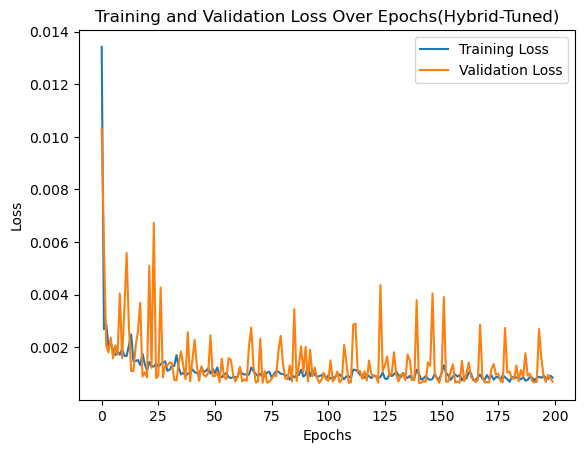

In [5]:
# Evaluate the model on training data and print the training loss
# How well the model has learned the training data
train_loss = best_hybrid_model.evaluate(X_train, y_train, verbose=0)
print(f"Training Loss: {train_loss}")

# Evaluate the model on testing data and print the test loss
# How well the model generalizes to unseen data.
test_loss = best_hybrid_model.evaluate(X_test, y_test, verbose=0)
print(f"Test Loss: {test_loss}")

# Plot the training and validation loss over epochs to visualize the learning process
plt.plot(hybrid_history.history['loss'], label='Training Loss')
plt.plot(hybrid_history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss Over Epochs(Hybrid-Tuned)')  
plt.xlabel('Epochs')  
plt.ylabel('Loss')  
plt.legend()
plt.show()


12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step
Mean Squared Error: 2261042.767088851
Mean Absolute Error: 1054.8958689830501
Mean Absolute Percentage Error (MAPE): 2.047196089046199%
R-squared: 0.990405998922889


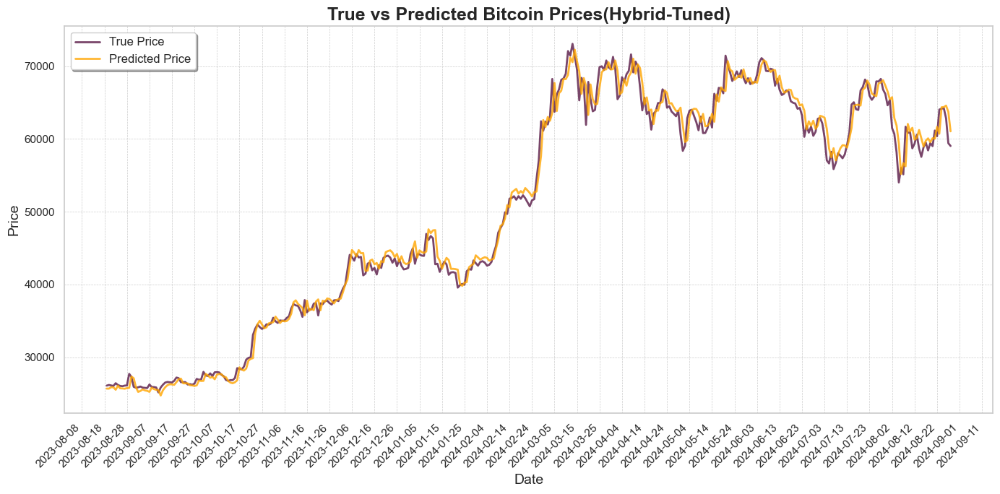

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.dates as mdates
import seaborn as sns
# Make predictions on the test set
y_test_pred = best_hybrid_model.predict(X_test)

# Reshape y_test and y_test_pred to 2D arrays for inverse transformation
y_test_pred_reshaped = y_test_pred.reshape(-1, 1)
y_test_reshaped = y_test.reshape(-1, 1)

# Create dummy arrays for other features (zeros) for inverse transformation (excluding close price)
dummy_array_before_close = np.zeros((y_test_pred_reshaped.shape[0], len(features) - 2))  # For columns before the Close price
dummy_array_after_close = np.zeros((y_test_pred_reshaped.shape[0], 1))  # For columns after the Close price

# Combine dummy arrays with actual 'Close' price predictions for inverse transformation
# Insert the predicted 'Close' price in the second last column (before the last feature)
y_test_pred_combined = np.hstack((
    dummy_array_before_close,  # Features before 'Close'
    y_test_pred_reshaped,      # 'Close' price predictions
    dummy_array_after_close    # Features after 'Close'
))

y_test_combined = np.hstack((
    dummy_array_before_close,  # Features before 'Close'
    y_test_reshaped,           # Actual 'Close' prices
    dummy_array_after_close    # Features after 'Close'
))

# Perform inverse transformation to get actual 'Close' prices from the scaled values
y_test_pred_inverse = scaler.inverse_transform(y_test_pred_combined)[:, -2]  # Extract the predicted 'Close' price
y_test_inverse = scaler.inverse_transform(y_test_combined)[:, -2]  # Extract column that corresponds to the actual 'Close' price


# Calculate evaluation metrics to assess model performance
mse = mean_squared_error(y_test_inverse, y_test_pred_inverse)  # Mean Squared Error
mae = mean_absolute_error(y_test_inverse, y_test_pred_inverse)  # Mean Absolute Error
mape = np.mean(np.abs((y_test_inverse - y_test_pred_inverse) / y_test_inverse)) * 100
r2 = r2_score(y_test_inverse, y_test_pred_inverse)  # R-squared


# Print evaluation metrics
print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Error: {mae}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")
print(f"R-squared: {r2}")

# Convert dates for x-axis
dates = date_data['Date'].iloc[-len(y_test_inverse):]

# Set the seaborn style for better aesthetics
sns.set(style="whitegrid")

# Plot the true vs predicted values to visualize model accuracy
plt.figure(figsize=(14, 7))
plt.plot(dates, y_test_inverse, label='True Price', color='#581845', linestyle='-', linewidth=2, alpha=0.8)  # Bright Cyan
plt.plot(dates, y_test_pred_inverse, label='Predicted Price', color='#FFA500', linestyle='-', linewidth=2, alpha=0.8)  # Bright Magenta

# Set x-axis to show dates properly
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=10))  # Adjust the interval for fewer ticks
plt.gcf().autofmt_xdate(rotation=45, ha='right')  # Rotate date labels for better readability

# Set y-axis to display true price values
plt.ylabel('Price')  # Remove the previous y-axis formatting

# Add title and labels
plt.title('True vs Predicted Bitcoin Prices(Hybrid-Tuned)', fontsize=18, fontweight='bold')
plt.xlabel('Date', fontsize=14)
plt.ylabel('Price', fontsize=14)

# Add a grid and legend
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.legend(fontsize=12, loc='upper left', frameon=True, shadow=True)

# Display the plot
plt.tight_layout()
plt.show()


In [7]:
import numpy as np

def exponential_moving_average(data, alpha=0.1):
    """
    Calculate the Exponential Moving Average (EMA) for a given data series.
    """
    ema = [data[0]]  # EMA starts with the first data point
    for point in data[1:]:
        ema.append(alpha * point + (1 - alpha) * ema[-1])
    return ema

# Predict the next 7 days
lst_output = []
n_steps = seq_length
i = 0
pred_days = 14
alpha = 0.1  # Smoothing factor for EMA


# Take the last sequence from the test set and reshape it into a 2D array
x_input = X_test[-1].reshape(1, n_steps, len(features))
# Convert the first row of x_input into a list for easier manipulation
temp_input = x_input[0].tolist()



while i < pred_days:
    # Reshape temp_input back to the shape the model expects
    x_input = np.array(temp_input).reshape(1, n_steps, len(features))
    
    # Predict the next day's 'Close' price
    yhat = best_hybrid_model.predict(x_input, verbose=0)
    
#     # Print the current temp_input for debugging purposes
#     print(f"Iteration {i+1}")
#     print(f"Current temp_input: {temp_input}")
#     print(f"Predicted value: {yhat[0]}")

    # Calculate the EMA of the last n_steps days for other features
    new_row = []
    for feature_index in range(len(features)):
        feature_data = [day[feature_index] for day in temp_input]
        ema_value = exponential_moving_average(feature_data, alpha)[-1]
        new_row.append(ema_value)
    new_row[3] = yhat[0][0]  # Update the 'Close' price (4th feature) with the predicted value

    # Update temp_input by removing the oldest row and adding the new row
    temp_input.append(new_row)  # Add the new row
    temp_input.pop(0)  # Remove the oldest row to maintain the sequence length

    # Add the predicted value to the output list
    lst_output.extend(yhat.tolist())
    
    # Increment the counter
    i += 1


print("Output of predicted next days: ", len(lst_output))

Output of predicted next days:  14


In [8]:
import plotly.express as px
from itertools import cycle

last_days = np.arange(1, n_steps + 1) # 1 to 7
day_pred = np.arange(n_steps + 1, n_steps + pred_days + 1) # 8 to 14

# Initialize a matrix to hold values, filled with NaNs in 2D arrays
temp_mat = np.empty((len(last_days) + pred_days, 1))
temp_mat[:] = np.nan

# Copy the matrix to hold original and predicted values
last_original_days_value = temp_mat.copy()
next_predicted_days_value = temp_mat.copy()

# Populate the original days values with actual prices
last_original_days_value[0:n_steps] = scaler.inverse_transform(
    np.hstack((scaled_data[-n_steps:, :-1], scaled_data[-n_steps:, -1].reshape(-1, 1)))
)[:, 3].reshape(-1, 1)

# Extend lst_output to have the same number of features as original data
extended_output = np.zeros((pred_days, len(features)))
extended_output[:, 3] = np.array(lst_output).reshape(-1)

# Populate the predicted days values
next_predicted_days_value[n_steps:] = scaler.inverse_transform(extended_output)[:, 3].reshape(-1, 1)

# Create DataFrame for plotting
dates = pd.date_range(start=date_data['Date'].iloc[-n_steps], periods=n_steps + pred_days, freq='D')
new_pred_plot = pd.DataFrame({
    'Date': dates,
    'Last 14 days close price': last_original_days_value.flatten(),
    'Predicted next 14 days close price': next_predicted_days_value.flatten()
})

# Create a melted DataFrame for easy plotting
new_pred_plot_melted = new_pred_plot.melt(id_vars=['Date'], value_vars=['Last 14 days close price', 'Predicted next 14 days close price'], var_name='Type', value_name='Price')

# Plotting with custom colors
fig = px.line(new_pred_plot_melted, x='Date', y='Price', color='Type',
              labels={'Price': 'Bitcoin price', 'Date': 'Date'},
              color_discrete_map={
                  'Last 14 days close price': '#8c8987',  # Custom color for last 14 days
                  'Predicted next 14 days close price': '#ff9c24'  # Custom color for next 14 days
              })

# Update layout to include gridlines for both axes
fig.update_layout(
    title_text='Compare last 14 days vs next 14 days(Hybrid-Tuned)',
    plot_bgcolor='white',
    font_size=15,
    font_color='black',
    legend_title_text='Close Price',
    xaxis=dict(
        showgrid=True,  # Show gridlines on x-axis
        gridcolor='lightgray',  # Color of gridlines
        gridwidth=0.5  # Thickness of gridlines
    ),
    yaxis=dict(
        showgrid=True,  # Show gridlines on y-axis
        gridcolor='lightgray',  # Color of gridlines
        gridwidth=0.5  # Thickness of gridlines
    ),
    legend=dict(
        font=dict(size=14),  # Adjust legend font size to be smaller
        orientation="h",  # Horizontal orientation
        yanchor="bottom",  # Position the legend at the bottom
        y=0.95,
        xanchor="right",
        x=1
    )
)

fig.show()


# Output the predicted prices for the next 14 days
predicted_prices = pd.DataFrame({
    'Date': dates[-pred_days:],
    'Predicted Close Price': next_predicted_days_value[-pred_days:].flatten()
})

print("Predicted Close Prices for the Next 14 Days:")
print(predicted_prices)


Predicted Close Prices for the Next 14 Days:
         Date  Predicted Close Price
0  2024-08-29           61045.397713
1  2024-08-30           62110.581535
2  2024-08-31           62424.946160
3  2024-09-01           62508.738936
4  2024-09-02           62474.044397
5  2024-09-03           62446.418529
6  2024-09-04           62357.506942
7  2024-09-05           62357.585483
8  2024-09-06           62404.412867
9  2024-09-07           62388.110531
10 2024-09-08           62658.273766
11 2024-09-09           62921.651761
12 2024-09-10           63125.345586
13 2024-09-11           63240.640048


In [9]:
import pandas as pd
import numpy as np
import plotly.express as px
# Inverse transform the predicted values for the next 7 days
predicted_values = scaler.inverse_transform(extended_output)[:, 3]

# Create a DataFrame for plotting
plot_df = pd.DataFrame({
    'Date': pd.concat([date_data['Date'], pd.Series(pd.date_range(start=date_data['Date'].iloc[-1], periods=pred_days + 1, freq='D')[1:])]).reset_index(drop=True),
    'Close Price': np.concatenate([data['Close'], predicted_values]),
    'Type': ['Original'] * len(data) + ['Predicted'] * pred_days
})

# Plotting with Plotly
fig = px.line(plot_df, x='Date', y='Close Price', color='Type',
              labels={'Close Price': 'Bitcoin Price', 'Date': 'Date'},
              title='Entire Closing Price with Next 14 Days Prediction')

# Customize the layout
fig.update_layout(
    title_text='Entire Closing Price with Next 14 Days Prediction based Hybrid-Tuned',
    title_x=0.5,
    plot_bgcolor='white',
    font=dict(size=15, color='black'),
    legend_title_text='Price Type'
)

# Add a vertical line to separate original data from predictions
fig.add_shape(type="line",
              x0=date_data['Date'].iloc[-1], y0=0, x1=date_data['Date'].iloc[-1], y1=1,
              line=dict(color="Gray", width=1.5, dash="dash"),
              xref='x', yref='paper')

# Add annotation
fig.add_annotation(x=date_data['Date'].iloc[-1], y=data['Close'].iloc[-1],
                   text='Prediction Start',
                   showarrow=True,
                   arrowhead=2,
                   ax=0, ay=-40)

# Show plot
fig.show()
